<a href="https://colab.research.google.com/github/syoooooung/capstone_design/blob/main/Query_Decomposition/RAG_core_decomposed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install langchain openai weaviate-client ragas datasets faiss-gpu sentence_transformers anthropic groq

INFO: pip is looking at multiple versions of ragas to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 375.0/375.0 kB 30.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.5/374.5 kB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.3/474.3 kB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.1/249.1 kB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 891.9/891.9 kB 55.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.5/106.5 kB

In [ ]:
from google.colab import drive
from langchain.vectorstores import FAISS
import faiss
from langchain_openai import OpenAIEmbeddings
from langchain.embeddings import OpenAIEmbeddings
from google.colab import drive, userdata
import os

os.environ['OPENAI_API_KEY'] = userdata.get('OPENAI_API_KEY')

drive.mount('/content/drive')

file_path = '/content/drive/MyDrive/Jimin/hotpotqa_test_compressed_vectorstore_ver2.index'

embeddings = OpenAIEmbeddings()

Mounted at /content/drive


<ipython-input-2-97eaa8f6595b>:15: LangChainDeprecationWarning: The class `OpenAIEmbeddings` was deprecated in LangChain 0.0.9 and will be removed in 1.0. An updated version of the class exists in the langchain-openai package and should be used instead. To use it run `pip install -U langchain-openai` and import as `from langchain_openai import OpenAIEmbeddings`.
  embeddings = OpenAIEmbeddings()


In [ ]:
# FAISS 인덱스 파일 로드
loaded_vectorstore = FAISS.load_local(
    folder_path=file_path,
    embeddings=embeddings,
    allow_dangerous_deserialization=True
)

In [ ]:
retriever = loaded_vectorstore.as_retriever(search_kwargs={"k": 3})

In [ ]:
from langchain_openai import OpenAI
from langchain.prompts import ChatPromptTemplate
from langchain.schema.runnable import RunnablePassthrough
from langchain.schema.output_parser import StrOutputParser
from langchain.chat_models import ChatOpenAI
from langchain.llms import Anthropic
import os
from google.colab import drive, userdata


# Define LLM
llm = ChatOpenAI(model_name="gpt-4o-mini", temperature=0.1) # or gpt-4o-mini gpt-3.5-turbo

# Define prompt template
template = """You are an assistant for question-answering tasks.
Use the following pieces of retrieved context to answer the question.
If you don't know the answer, just say that you don't know.
Use two sentences maximum and keep the answer concise.
Question: {question}
Context: {context}
Answer:
"""

prompt = ChatPromptTemplate.from_template(template)

# Setup RAG pipeline
rag_chain = (
    {"context": RunnablePassthrough(),  "question": RunnablePassthrough()}
    | prompt
    | llm
    | StrOutputParser()
)

<ipython-input-5-955af336c3ce>:12: LangChainDeprecationWarning: The class `ChatOpenAI` was deprecated in LangChain 0.0.10 and will be removed in 1.0. An updated version of the class exists in the langchain-openai package and should be used instead. To use it run `pip install -U langchain-openai` and import as `from langchain_openai import ChatOpenAI`.
  llm = ChatOpenAI(model_name="gpt-4o-mini", temperature=0.1) # or gpt-4o-mini gpt-3.5-turbo


In [ ]:
from datasets import Dataset
from datasets import load_dataset

dataset = load_dataset("hotpotqa/hotpot_qa", "fullwiki")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


hotpot_qa.py:   0%|          | 0.00/6.42k [00:00<?, ?B/s]

README.md:   0%|          | 0.00/9.19k [00:00<?, ?B/s]

The repository for hotpotqa/hotpot_qa contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/hotpotqa/hotpot_qa.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N] y


Generating train split:   0%|          | 0/90447 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/7405 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/7405 [00:00<?, ? examples/s]

In [ ]:
print(dataset['validation'][0])

{'id': '5a8b57f25542995d1e6f1371', 'question': 'Were Scott Derrickson and Ed Wood of the same nationality?', 'answer': 'yes', 'type': 'comparison', 'level': 'hard', 'supporting_facts': {'title': ['Scott Derrickson', 'Ed Wood'], 'sent_id': [0, 0]}, 'context': {'title': ['Adam Collis', 'Ed Wood (film)', 'Tyler Bates', 'Doctor Strange (2016 film)', 'Hellraiser: Inferno', 'Sinister (film)', 'Deliver Us from Evil (2014 film)', 'Woodson, Arkansas', 'Conrad Brooks', 'The Exorcism of Emily Rose'], 'sentences': [['Adam Collis is an American filmmaker and actor.', ' He attended the Duke University from 1986 to 1990 and the University of California, Los Angeles from 2007 to 2010.', ' He also studied cinema at the University of Southern California from 1991 to 1997.', ' Collis first work was the assistant director for the Scott Derrickson\'s short "Love in the Ruins" (1995).', ' In 1998, he played "Crankshaft" in Eric Koyanagi\'s "Hundred Percent".'], ['Ed Wood is a 1994 American biographical peri

In [ ]:
loop_count = 90

questions = dataset['validation']['question'][:loop_count]
evidence_list = dataset['validation']['supporting_facts'][:loop_count]

ground_truths = dataset['validation']['answer'][:loop_count]

print(ground_truths)
print(evidence_list)

['yes', 'Chief of Protocol', 'Animorphs', 'no', 'Greenwich Village, New York City', 'YG Entertainment', 'Eenasul Fateh', '3,677 seated', 'Terry Richardson', 'yes', 'Kansas Song', 'David Weissman', '1999', 'no', 'from 1986 to 2013', '9,984', 'the North Atlantic Conference', 'yes', '1969 until 1974', 'Robert Erskine Childers DSC', 'Pedro Rodríguez', 'Sonic', 'keyboard function keys', 'Badly Drawn Boy', "World's Best Goalkeeper", 'Barton Lee Hazlewood', '1838', 'yes', 'Henry J. Kaiser', 'Arena of Khazan', '2000', 'Fujioka, Gunma', 'Charles Eugène', 'no', 'Letters to Cleo', 'October 1922', '2000', 'World War II', 'no', 'New York City', 'Scotch Collie', 'Mumbai', '1962', 'sovereignty', 'Nelson Rockefeller', 'Yellowcraig', 'Phil Spector', 'Organizations could come together to address global issues', 'yes', 'English Electric Canberra', '2009 Big 12 Conference', '1,462', 'Indianapolis Motor Speedway', 'Rome', 'Max Martin, Savan Kotecha and Ilya Salmanzadeh', 'Marion, South Australia', 'Driftin

In [ ]:
# # supporting_facts 형태 변경
# import json
# import bz2
# import re

# facts_list = []

# index_output_path = '/content/drive/My Drive/Jimin/title_index.json'
# wiki_path = '/content/drive/My Drive/Jimin/enwiki-20171001-pages-meta-current-withlinks-processed'


# def search_title_in_index(title, index_path):
#     """생성된 인덱스 파일에서 title로 검색"""
#     with open(index_path, 'r') as index_file:
#         title_index = json.load(index_file)

#     return title_index.get(title, None)

# for i, fact in enumerate(evidence_list):
#   sub_list = []
#   for index, each_fact in enumerate(fact["title"]):
#     search_result = search_title_in_index(each_fact, index_output_path)
#     print(search_result)
#     folder_path = os.path.join(wiki_path, search_result[0]['folder_name'])
#     file_path = os.path.join(folder_path, search_result[0]['file_name'])
#     with bz2.open(file_path, 'rt') as bz2_file:
#       content = bz2_file.read()
#       splitted_data = content.strip().split('\n')

#       for each_line in splitted_data:
#           each_json_data = json.loads(each_line)
#           if each_json_data["title"] == each_fact:
#             sent_id = fact["sent_id"][index]
#             print(f'{each_fact} and {sent_id} and quesion: {questions[i]}')
#             found_sentence = None;
#             for paragraph in each_json_data["text"][1:]:
#               paragraph_length = len(paragraph)
#               if paragraph_length < sent_id:
#                 sent_id -= paragraph_length
#               else:
#                 found_sentence = re.sub('<[^<]+?>', '', paragraph[sent_id])
#                 break;

#             sub_list.append(found_sentence)
#             print(found_sentence)
#             break
#   facts_list.append(sub_list)

# print(facts_list)

In [ ]:
# facts_list_temp = [['Scott Derrickson (born July 16, 1966) is an American director, screenwriter and producer.', 'In the 1950s, Wood made a number of low-budget films in the science fiction, comedy, and horror genres, intercutting stock footage.'], ['Kiss and Tell is a 1945 American comedy film starring then 17-year-old Shirley Temple as Corliss Archer.', 'Temple began her film career at the age of three in 1932.', 'In 1958, Temple returned to show business with a two-season television anthology series of fairy tale adaptations.'], ['The Hork-Bajir Chronicles is the second companion book to the "Animorphs" series, written by K. A. Applegate.', '"The Hork-Bajir Chronicles" is one of the most unusual novels in the Animorphs series because, like "The Ellimist Chronicles" (which is also a book ended with a scene involving one of the Animorphs), it has an almost complete lack of human characters (Tobias, who appears in the prologue and epilogue, is human, albeit trapped in hawk morph).', 'It should also be noted that, while the moral implications of war are a common theme in the Animorphs series, "The Hork-Bajir Chronicles" is one of the novels in that series that deals most heavily with that theme (such as the loss of innocence during the battle on the Hork-Bajir homeworld and war crimes being committed by the usually honorable Andalites).', 'Throughout the series, the Animorphs carefully protect their identities; the Yeerks assume that the Animorphs are a strike force sent by the Andalites, the alien race that created the transformation technology, to prevent them from conquering Earth.', 'Though the Animorphs can assume the form of any animal they touch, there are several limitations to the ability.'], ['The Laleli Mosque (Turkish: "Laleli Camii, or Tulip Mosque" ) is an 18th-century Ottoman imperial mosque located in Laleli, Fatih, Istanbul, Turkey.', 'The three-storey brick building was designed by the renowned architect Sarkis Balyan and finished in 1875 next to Ortaköy Mosque.'], ['Big Stone Gap is a 2014 American drama romantic comedy film written and directed by Adriana Trigiani and produced by Donna Gigliotti for Altar Identity Studios, a subsidiary of Media Society.', "Inspired by her Italian American heritage and Appalachian childhood in Big Stone Gap, Virginia, Trigiani arrived in New York in 1985 after attending Saint Mary's College in Indiana."], ['2014 S/S is the debut album of South Korean group WINNER.', 'The group was formed through the 2013 reality survival program "WIN: Who is Next", where they competed as "Team A" against other trainees from YG Entertainment for the chance to debut as the first YG boy group in eight years, since the debut of Big Bang.'], ['Eenasul Fateh (Bengali: ঈনাসুল ফাতেহ ; born 3 April 1959), also known by his stage name Aladin, is a Bangladeshi-British cultural practitioner, magician, live artist and former international management consultant.', 'As a result of their exposure to, and relationships with numerous organizations, consulting firms are typically aware of industry "best practices." However, the specific nature of situations under consideration may limit the ability to transfer such practices from one organization to another.'], ['The Lewiston Maineiacs were a junior ice hockey team of the Quebec Major Junior Hockey League based in Lewiston, Maine.', 'It is the former home of the now-defunct Lewiston Maineiacs ice hockey team and was the home arena for the Portland Pirates of the American Hockey League for the 2013–2014 season.'], ['Annie Morton (born October 8, 1970) is an American model born in Pennsylvania.', 'She has appeared on many magazine covers and has been featured in several professional photobooks, Peter Lindbergh Selected Work, the cover of Juergen Teller By Juergen Teller, Helmut Newton Pages From The Glossies, and Donna Karan\'s book "A Journey Of A Woman 20 Years" by Donna Karen.', 'His mother reportedly gave Richardson his first snapshot camera in 1982.'], ['Local H is an American rock band originally formed by guitarist and vocalist Scott Lucas, bassist Matt Garcia, drummer Joe Daniels, and lead guitarist John Sparkman in Zion, Illinois in 1987.', 'Something of an anomaly in Midwestern America, For Against—especially early in its career—has looked to a distinctly British aesthetic for inspiration, most obviously the post-punk scene exemplified by the early rosters of the Factory and 4AD record labels.']]

In [ ]:
import pickle

save_path = '/content/drive/My Drive/Jimin/facts_list.pkl'


def save_supporting_facts(facts_list, save_path):
    """Google Drive에 문서 데이터를 저장하기"""
    with open(save_path, 'wb') as f:
        pickle.dump(facts_list, f)

def load_supporting_facts(load_path):
    """Google Drive에서 문서 데이터를 불러오기"""
    with open(load_path, 'rb') as f:
        facts_list = pickle.load(f)
    return facts_list

# save_supporting_facts(facts_list, save_path)
loaded_facts_list = load_supporting_facts(save_path)
print(loaded_facts_list)

[['Scott Derrickson (born July 16, 1966) is an American director, screenwriter and producer.', 'Edward Davis Wood Jr. (October 10, 1924\xa0– December 10, 1978) was an American filmmaker, actor, writer, producer, and director.'], ['Kiss and Tell is a 1945 American comedy film starring then 17-year-old Shirley Temple as Corliss Archer.', "Shirley Temple Black (April 23, 1928\xa0– February 10, 2014) was an American actress, singer, dancer, businesswoman, and diplomat who was Hollywood's number one box-office draw as a child actress from 1935 to 1938.", ' As an adult, she was named United States ambassador to Ghana and to Czechoslovakia and also served as Chief of Protocol of the United States.'], ['The Hork-Bajir Chronicles is the second companion book to the "Animorphs" series, written by K. A. Applegate.', ' With respect to continuity within the series, it takes place before book #23, "The Pretender", although the events told in the story occur between the time of "The Ellimist Chronicl

## Decomposition


In [ ]:
!pip install anthropic
!pip install langchain_community
!pip install -U accelerate bitsandbytes datasets evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.5/137.5 MB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 3.5 MB/s eta 0:00:00


In [ ]:
import anthropic
from google.colab import userdata
# Anthropics API 설정
ANTHROPIC_API_KEY = userdata.get('ANTHROPIC_API_KEY')

RE_prompt = """
You are a competent relationship extractor.
The goal is to extract the meaning in the query.
Please extract relationships between entities. However, you should extract only the knowledge that exists in the query, not the relationship between entities using existing knowledge.
Please extract the relation with the words that exist in the query as much as possible.
All relationships should be extracted in the form of Entity|Relationship|Entity.
Only relation must be in the middle
Necessarily Do not use any entity other than that given. Don't change the entity as you please.
The given entity should be extracted separately for each entity.
Interrogative should be included as entity.
Don't print anything other than what you asked

e.g.)
Question: What measures might the international community take if X (formerly Twitter) fails to comply with the European Union's Code?
List of Entities: What, measures, international community, X (formerly Twitter), European Union's Code

->
What|to|measures
international community|take|measures
measures|assume|X (formerly Twitter)
X (formerly Twitter)|fails to comply with|European Union's Code

e.g. )
Question: Is the legal battle between Google and Epic Games unprecedented?
List of Entities: legal battle, Google and Epic Games

->
legal battle|between|Google and Epic Games

e.g. )
Question: Who was the Super Bowl MVP in 1979 and 1980.
List of Entities: Who, Super Bowl MVP, 1979 and 1980

->
Who|was|Super Bowl MVP
Super Bowl MVP|in|1979 and 1980
"""

NER_prompt = """
You are a capable entity extractor.
You need to extract all Entities from the given sentence (query, question).
You need to extract all the entities that have meaning in the sentence.
All Entities should be extracted in the form of Entities, Entities, Entities.
When extracting entity, extract as much as possible.
interrogative word must should be treated as an entity Where was it located.
Don't print anything other than what you asked

e.g. )
Question: What measures might the international community take if X (formerly Twitter) fails to comply with the European Union's Code?

->
What, measures, international community, X (formerly Twitter), European Union's Code

e.g. )
Question: Who was the Super Bowl MVP in 1979 and 1980.

->
Who, Super Bowl MVP, 1979 and 1980

e.g. )
Question: 2014 S/S is the debut album of a South Korean boy group that was formed by who?

->
2014 S/S, debut album, South Korean boy group, who
"""

#core
system_message = """
    You are an experienced Named Entity Recognizer.
    Your task is to extract entities from the given text and classify them as either 'core' or 'etc'.


    The reason for extracting 'core' and 'etc' entities is to facilitate query decomposition. By recognizing 'core' and 'etc' entities, the query can be divided into multiple sub-queries for more precise information retrieval. For example, the query "Who was the Super Bowl MVP in 1979 and 1980?" can be decomposed into "Who was the Super Bowl MVP in 1979?" and "Who was the Super Bowl MVP in 1980?" based on the identified entities: Super Bowl MVP (core), 1979 (etc), and 1980 (etc).

    - 'core' entities are the main subjects or topics that are consistent across variations of the query.The query will be divided based on this entity.
    - 'etc' entities represent others except for 'core'

    We're going to divide the query based on 'core',
    so it's a condition that one entity has to have a relationship with two or more entities to become 'core'.

    Furthermore, the ultimate goal is to extract entities from the query, use them to create nodes, and build a knowledge graph. This knowledge graph will enable more efficient and accurate information retrieval and analysis.
    If it is judged that there is no 'core', you can judge all entities as 'etc'.


    I'll provide the query, the entities, and the relationship between them in the following format: Entity: entity list... \n subject|relation|object ....
    Write the entities in the following format: EntityName (tag).



    Example:
    Query: Who was the Super Bowl MVP in 1979 and 1980?\nEntity: Super Bowl MVP, 1979, 1980\nSuper Bowl MVP|was|1979\nSuper Bowl MVP|was|1980
    You:
    Super Bowl MVP (core), 1979 (etc), 1980 (etc)

    Example:
    Query: Are Chris Marker and Yvonne Rainer American?\nEntity: Chris Marker, Yvonne Rainer, American\nChris Marker|is|American\nYvonne Rainer|is|American
    You:
    Chris Marker (etc), Yvonne Rainer (etc), American (core)

    Example:
    Query: How has Elon Musk's acquisition of X (formerly Twitter) impacted the stock prices and market valuation of related companies such as Tesla and SpaceX?\nEntity: Elon Musk's acquisition, X (formerly Twitter), stock prices, market valuation, Tesla , SpaceX\nElon Musk's acquisition|impacts|stock prices\nElon Musk's acquisition|impacts|market valuation\nElon Musk's acquisition|impacts|Tesla\nElon Musk's acquisition|impacts|SpaceX
    You:
    Elon Musk's acquisition (etc), X (formerly Twitter) (etc), stock prices (etc), market valuation of related companies (core), Tesla (etc), SpaceX (etc)

    Example:
    Query: Who directed The Godfather and Apocalypse Now?\nEntity: Who, The Godfather, Apocalypse Now\nWho|directed|The Godfather\nWho|directed|Apocalypse Now
    You:
    Who (core), The Godfather (etc), Apocalypse Now (etc)

    Treat possessive forms (e.g., Mary's) as part of the same entity.
    Do not add anything else.
    When you present the results, you must present the results in the form of all the entities I gave you. Don't get rid of the entity
    Keep in mind that you can't be a 'core' if you don't get that entity more than once in the relationship I give you.
    Just proceed tagging on the entity list I gave you and don't remove it or add it.
"""

graph_to_text = """You are an experienced text generator.
Please create a complete sentence using all the triples given.
The text will be provided in the format (entity, relation, entity).
Do not add anything else.
Example Text: [('Sam', 'received', 'award'), ('award', 'from', 'the Academy awards')]
Answer: Sam received an award from the Academy awards
"""

client = anthropic.Anthropic(
    api_key=ANTHROPIC_API_KEY,
)

In [ ]:
import openai
from google.colab import userdata

OPENAI_API_KEY = userdata.get('OPENAI_API_KEY')

openai.api_key = OPENAI_API_KEY



# gpt-4o, gpt-4o-mini, gpt-4-turbo, gpt-3.5-turbo
model = "gpt-4o-mini"

# entity 뽑기
def get_entities(query):
  # message = client.messages.create(
  #     model="claude-3-5-sonnet-20240620",
  #     max_tokens=1000,
  #     temperature=0.1,
  #     system=NER_prompt,
  #     messages=[
  #         {"role": "user", "content": query}
  #     ]
  # )
  # return message.content[0].text
  messages = [{
      "role": "system",
      "content": NER_prompt
  }, {
      "role": "user",
      "content": query
  }]
  response = openai.chat.completions.create(
    model=model,
    messages=messages
  )

  return response.choices[0].message.content

# re 뽑기
def get_re(words, query):
  all = "Question: " + query + "\nList of Entities:" + words
  # message = client.messages.create(
  #       model="claude-3-5-sonnet-20240620",
  #       max_tokens=1000,
  #       temperature=0.1,
  #       system=RE_prompt,
  #       messages=[
  #           {"role": "user", "content": all}
  #       ]
  #   )
  # return message.content[0].text
  messages = [{
      "role": "system",
      "content": RE_prompt
  }, {
      "role": "user",
      "content": all
  }]
  response = openai.chat.completions.create(
    model=model,
    messages=messages
  )

  return response.choices[0].message.content

# core 뽑기
def get_core(words, relations, query):
  all = "Query: " + query + "\nEntity: " + words + "\n" + relations
  # message = client.messages.create(
  #       model="claude-3-5-sonnet-20240620",
  #       max_tokens=1000,
  #       temperature=0.1,
  #       system=system_message,
  #       messages=[
  #           {"role": "user", "content": all}
  #       ]
  #   )
  # return message.content[0].text
  messages = [{
      "role": "system",
      "content": system_message
  }, {
      "role": "user",
      "content": all
  }]
  response = openai.chat.completions.create(
    model=model,
    messages=messages
  )

  return response.choices[0].message.content

In [ ]:
def convert_core(q1_before):
    # 각 항목을 분리하여 리스트로 변환
    components = [comp.strip() for comp in q1_before.split(',')]

    # 엔티티와 속성 파싱
    entities = []
    for comp in components:
        if '(' in comp and ')' in comp:
            entity, attribute = comp.split('(')
            attribute = attribute.strip(')').strip()
        else:
            entity = comp.strip()
            attribute = 'core'  # 기본 속성으로 설정
        entities.append({'entity': entity.strip(), 'attribute': attribute})

    return entities


def convert_rener(entities, relations):
    # 엔티티 추출
    entities = [item.strip() for item in entities.split(",")]

    # 관계 추출
    extracted_relations = []
    lines = relations.splitlines()
    for line in lines:
        parts = line.split("|")
        if len(parts) == 3:
            subject = parts[0].strip()
            relation = parts[1].strip()
            obj = parts[2].strip()
            extracted_relations.append({'subject': subject, 'relation': relation, 'object': obj})

    result = {
        'entities': entities,
        'relations': extracted_relations
    }

    return result

In [ ]:
import os
from groq import Groq
import time
from tqdm import tqdm
import networkx as nx
import matplotlib.pyplot as plt
import pprint
import re

gclient = Groq(
    api_key=userdata.get("GROQ"),
)


def process_data(prompt):

    """Send one request and retrieve model's generation."""

    chat_completion = gclient.chat.completions.create(
        messages=prompt, # input prompt to send to the model
        model="llama3-70b-8192", # according to GroqCloud labeling
        temperature=0.5, # controls diversity
        max_tokens=128, # max number tokens to generate
        top_p=1, # proportion of likelihood weighted options to consider
        stop=None, # string that signals to stop generating
        stream=False, # if set partial messages are sent
    )
    return chat_completion.choices[0].message.content

In [ ]:
# from collections import deque

# def has_node_type(graph, node_type):
#     return any(data.get('type') == node_type for node, data in graph.nodes(data=True))

# def recursion_subgraph(G, node):
#   subgraphs = []

#   # 그래프가 비어있으면 return 빈 배열
#   if not G:
#     return subgraphs

#   if not has_node_type(G, "core"):
#     return [G.copy()] # core가 있는가? 없으면 전체 G 반환

#   # core가 있으면 sub graph로 나뉘어져야 하므로, 분할
#   upper_graph = nx.DiGraph() #현재 노드를 포함하는 상위 그래프
#   queue = deque([node])
#   visited = set()

#   while queue:
#     current_node = queue.popleft()
#     if current_node in visited:
#       continue
#     visited.add(current_node)

#     # Upper graph에 노드 및 엣지 추가 (노드 및 엣지 데이터 포함)
#     upper_graph.add_node(current_node, **G.nodes[current_node])

#     # 현재 노드가 core 노드인지 확인
#     if G.nodes[current_node].get('type') == 'core':
#         # core 노드에서 나가는 엣지들을 기준으로 서브그래프 나누기
#         for neighbor in G.successors(current_node):
#           # 각 서브그래프에 대한 노드 및 엣지 정보를 추출
#           sub_graph_nodes = list(nx.descendants(G, neighbor))
#           sub_graph_nodes.append(neighbor)

#           # 서브그래프에 노드 및 엣지 속성 복사
#           sub_subgraph = G.subgraph(sub_graph_nodes).copy()

#           # 재귀적으로 sub-subgraph를 처리
#           recursive_subgraphs = recursion_subgraph(sub_subgraph, neighbor)


#           # Upper graph와 현재 core 노드를 합쳐서 새로운 서브그래프 저장
#           for sg in recursive_subgraphs:
#               combined_subgraph = nx.compose(upper_graph, sg)

#               if G.has_edge(current_node, neighbor):
#                         edge_data = G.get_edge_data(current_node, neighbor)
#                         combined_subgraph.add_edge(current_node, neighbor, **edge_data)

#               subgraphs.append(combined_subgraph)

#         return subgraphs  # core에서 분리되므로 upper_graph를 반환하지 않음


#     # 자식 노드들 탐색 및 엣지 추가
#     for neighbor in G.successors(current_node):
#         if neighbor not in visited:
#             queue.append(neighbor)
#             upper_graph.add_edge(current_node, neighbor, **G.edges[current_node, neighbor])


#   # 만약 core 노드가 있지만, 더 이상 탐색할 노드가 없다면 upper_graph만 반환
#   if upper_graph:
#       subgraphs.append(upper_graph)


#   # root에서 시작해서 core까지 uppder_graph에 node, edge정보 다 저장하면서 이동
#   # core를 만나면 core에서 out하는 edge를 각각 subgraph로 두고, (core는 포함하지 않음)
#   # 그 subgraph를 recursion_subgraph로 돌려서 얻은 sub-subgraph들을 지금까지 저장한
#   # upper_subgraph랑 core랑 합쳐서 subgraphs에 저장(근데 만약에 core노드에 왔는데
#   #                                         core말고 같은 level에 노드가 하나 더 있는데
#   #                                         그걸 포함 안했다면?)


#   return subgraphs

In [ ]:

import networkx as nx

# ipython-input-17-cc450a74d3dd

from collections import deque

def has_node_type(graph, node_type):
    return any(data.get('type') == node_type for node, data in graph.nodes(data=True))

def recursion_subgraph(G, node): # removed the '#' comment character to uncomment this function definition
  subgraphs = []

  # 그래프가 비어있으면 return 빈 배열
  if not G:
    return subgraphs

  if not has_node_type(G, "core"):
    return [G.copy()] # core가 있는가? 없으면 전체 G 반환

  # core가 있으면 sub graph로 나뉘어져야 하므로, 분할
  upper_graph = nx.DiGraph() #현재 노드를 포함하는 상위 그래프
  queue = deque([node])
  visited = set()

  while queue:
    current_node = queue.popleft()
    if current_node in visited:
      continue
    visited.add(current_node)

    # Upper graph에 노드 및 엣지 추가 (노드 및 엣지 데이터 포함)
    upper_graph.add_node(current_node, **G.nodes[current_node])

    # 현재 노드가 core 노드인지 확인
    if G.nodes[current_node].get('type') == 'core':
        # core 노드에서 나가는 엣지들을 기준으로 서브그래프 나누기
        for neighbor in G.successors(current_node):
          # 각 서브그래프에 대한 노드 및 엣지 정보를 추출
          sub_graph_nodes = list(nx.descendants(G, neighbor))
          sub_graph_nodes.append(neighbor)

          # 서브그래프에 노드 및 엣지 속성 복사
          sub_subgraph = G.subgraph(sub_graph_nodes).copy()

          # 재귀적으로 sub-subgraph를 처리
          recursive_subgraphs = recursion_subgraph(sub_subgraph, neighbor)


          # Upper graph와 현재 core 노드를 합쳐서 새로운 서브그래프 저장
          for sg in recursive_subgraphs:
              combined_subgraph = nx.compose(upper_graph, sg)

              if G.has_edge(current_node, neighbor):
                        edge_data = G.get_edge_data(current_node, neighbor)
                        combined_subgraph.add_edge(current_node, neighbor, **edge_data)

              subgraphs.append(combined_subgraph)

        return subgraphs  # core에서 분리되므로 upper_graph를 반환하지 않음


    # 자식 노드들 탐색 및 엣지 추가
    for neighbor in G.successors(current_node):
        if neighbor not in visited:
            queue.append(neighbor)
            upper_graph.add_edge(current_node, neighbor, **G.edges[current_node, neighbor])


  # 만약 core 노드가 있지만, 더 이상 탐색할 노드가 없다면 upper_graph만 반환
  if upper_graph:
      subgraphs.append(upper_graph)


  # root에서 시작해서 core까지 uppder_graph에 node, edge정보 다 저장하면서 이동
  # core를 만나면 core에서 out하는 edge를 각각 subgraph로 두고, (core는 포함하지 않음)
  # 그 subgraph를 recursion_subgraph로 돌려서 얻은 sub-subgraph들을 지금까지 저장한
  # upper_subgraph랑 core랑 합쳐서 subgraphs에 저장(근데 만약에 core노드에 왔는데
  #                                         core말고 같은 level에 노드가 하나 더 있는데
  #                                         그걸 포함 안했다면?)


  return subgraphs

In [ ]:
# import networkx as nx

# def split_graph_by_core_nodes(graph, core_type='core'):
#     subgraphs = []
#     core_nodes = [node for node, data in graph.nodes(data=True) if data.get('type') == core_type]

#     # `core` 노드가 없는 경우 그래프 전체를 그대로 반환
#     if not core_nodes:
#         return [graph]

#     # 각 `core` 노드를 기준으로 서브그래프를 생성
#     for core_node in core_nodes:
#         # core_node에서 나가는 모든 경로를 각각의 서브그래프로 분리
#         successors = list(graph.successors(core_node))

#         # core_node로 들어오는 모든 조상 노드를 찾기
#         predecessors = list(nx.ancestors(graph, core_node))

#         for successor in successors:
#             # BFS를 사용하여 successor에서 후속 노드를 모두 추출
#             bfs_successors = list(nx.bfs_tree(graph, source=successor).nodes)

#             # 조상 노드들 + core_node + BFS 후속 노드를 포함한 서브그래프 생성
#             subgraph_nodes = predecessors + [core_node] + bfs_successors
#             subgraph = graph.subgraph(subgraph_nodes).copy()

#             # core_node를 항상 서브그래프에 포함시키기
#             if core_node not in subgraph.nodes:
#                 subgraph.add_node(core_node, **graph.nodes[core_node])

#             subgraphs.append(subgraph)

#     return subgraphs

# def flatten_list(nested_list):
#     flat_list = []
#     for item in nested_list:
#         if isinstance(item, list):
#             flat_list.extend(flatten_list(item))
#         else:
#             flat_list.append(item)
#     return flat_list


In [ ]:
def query_decomposition(rener_json, cores_json):
  decomposed_queries = []

  G = nx.DiGraph()

  # G에 entity를 node로 추가
  for nodes in rener_json['entities']:
    G.add_node(nodes)

  for nodes_with_attribute in cores_json:
    entity = nodes_with_attribute['entity']
    attribute = nodes_with_attribute['attribute']

    # G에 노드로 존재하는 경우에만 아래 코드 수행, 단 추가가 아니라 type과 color만 변경
    if G.has_node(entity):
        if attribute == "core":
            G.add_node(entity, type=attribute, color="#FF0081")  # type: core, color: 핑크색
        elif attribute == "etc":
            G.add_node(entity, type=attribute, color="#5858FA")  # type: etc, color: 파란색
    else:
        G.add_node(entity, type="etc", color="#005DEA")  # type: 그 외, color: 파란색

  # rener_json 데이터에서 relations를 edge로 추가
  for edge in rener_json['relations']:
    G.add_edge(edge['subject'], edge['object'], relation=edge['relation'])

  # Knowledge Graph 시각화
  # 노드 라벨 생성 (노드 이름과 타입 정보 포함) (type이 없으면 unknown)
  labels = {node: f"{node}\n({data.get('type', 'unknown')})" for node, data in G.nodes(data=True)}

  # 전체 그래프 시각화
  plt.figure(figsize=(12, 12))
  pos = nx.spring_layout(G, k=0.5)  # 노드 배치를 위한 레이아웃 설정, 간격 0.5로 늘림

  # Node의 색상을 그대로 유지
  node_colors = [data.get('color', '#00BFFF') for node, data in G.nodes(data=True)]

  # Root Node를 [root_nodes]에 저장
  root_nodes = [node for node, in_degree in G.in_degree() if in_degree == 0]

  nx.draw(G, pos, labels=labels, node_color=node_colors, edge_color='gray', node_size=5000, font_size=10, arrows=True)

  # edge에 label 내용 추가
  edge_labels = nx.get_edge_attributes(G, 'relation')
  nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')


  # decomposition 시작
  # subgraph로 나누기
  sub_graphs = []
  for root in root_nodes:
    sub_graphs.extend(recursion_subgraph(G, root))
  # sub_graphs = split_graph_by_core_nodes(G, "core")

  # subgraph 시각화
  fig, ax = plt.subplots(figsize=(15, 15))
  x_offset = 0

  for i, subgraph in enumerate(sub_graphs):
    labels = {node: f"{node}\n({data.get('type', 'unknown')})" for node, data in subgraph.nodes(data=True)}
    node_colors = [data.get('color', '#00BFFF') for node, data in subgraph.nodes(data=True)]

    pos = nx.spring_layout(subgraph)
    pos = {node: (x + x_offset, y) for node, (x, y) in pos.items()}

    nx.draw(subgraph, pos, ax=ax, labels=labels, with_labels=True, node_size=4000, node_color=node_colors, font_size=10, font_color='black', edge_color='gray')
    # Edge label 추가
    edge_labels = nx.get_edge_attributes(subgraph, 'relation')
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_color='red')

    x_offset += 2


  # subgraph에서 tripleset 추출
  Final_triplesets = []
  def extract_triplesets(graph):
      triplesets = []
      for u, v, data in graph.edges(data=True):
          subject = u
          predicate = data.get('relation', 'relation')
          obj = v
          triplesets.append((subject, predicate, obj))
      return triplesets

  for SubGraph in sub_graphs:
      Final_triplesets.append(extract_triplesets(SubGraph))

  temp_decom_question = []
  for tr in Final_triplesets:
      print(tr)
      triples_text = ', '.join([f"('{triple[0]}', '{triple[1]}', '{triple[2]}')" for triple in tr])

      messages = [
          {"role": "system", "content": graph_to_text},
          {"role": "user", "content": triples_text}
      ]

      output = process_data(messages)
      decomposed_queries.append(output)

  return decomposed_queries


[('woman', 'portrayed', 'Corliss Archer'), ('Corliss Archer', 'in', 'film'), ('film', 'is', 'Kiss and Tell')]
[('What', 'has', 'science fantasy'), ('science fantasy', 'is', 'young adult series'), ('young adult series', 'told in', 'first person')]
[('What', 'has', 'science fantasy'), ('science fantasy', 'is', 'young adult series'), ('young adult series', 'has', 'companion books'), ('companion books', 'narrating', 'stories')]
[('What', 'has', 'science fantasy'), ('science fantasy', 'is', 'young adult series'), ('young adult series', 'has', 'companion books'), ('companion books', 'of', 'enslaved worlds')]
[('What', 'has', 'science fantasy'), ('science fantasy', 'is', 'young adult series'), ('young adult series', 'has', 'companion books'), ('companion books', 'of', 'alien species')]
[('Laleli Mosque', 'and', 'Esma Sultan Mansion'), ('Esma Sultan Mansion', 'located in', 'same neighborhood')]
[('Laleli Mosque', 'located in', 'same neighborhood')]
[('romantic comedy', 'is', '"Big Stone Gap"')

<ipython-input-20-91d83b98ccf9>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 12))


[('What', 'is', 'name')]
[]
[('university', 'has', 'main campus'), ('main campus', 'is in', 'Lawrence'), ('main campus', 'is in', 'Kansas')]
[('university', 'has', 'branch campuses'), ('branch campuses', 'are in', 'Kansas City metropolitan area')]
[('What', 'with', 'screenwriter'), ('screenwriter', 'for', 'credits')]
[('What', 'with', 'screenwriter'), ('screenwriter', 'co-wrote', 'film'), ('film', 'starring', 'Nicolas Cage')]
[('What', 'with', 'screenwriter'), ('screenwriter', 'co-wrote', 'film'), ('film', 'starring', 'Téa Leoni')]
[]
[]
[('What', 'did', 'year')]
[('Guns N Roses', 'perform', 'promo'), ('promo', 'for', 'movie'), ('movie', 'starring', 'Arnold Schwarzenegger'), ('Arnold Schwarzenegger', 'as', 'former New York Police detective')]
[('football manager', 'recruited', 'David Beckham')]
[('football manager', 'managed', 'Manchester United')]
[('football manager', 'during', 'timeframe')]
[('Brown State Fishing Lake', 'is in', 'country'), ('country', 'has', 'population'), ('popula

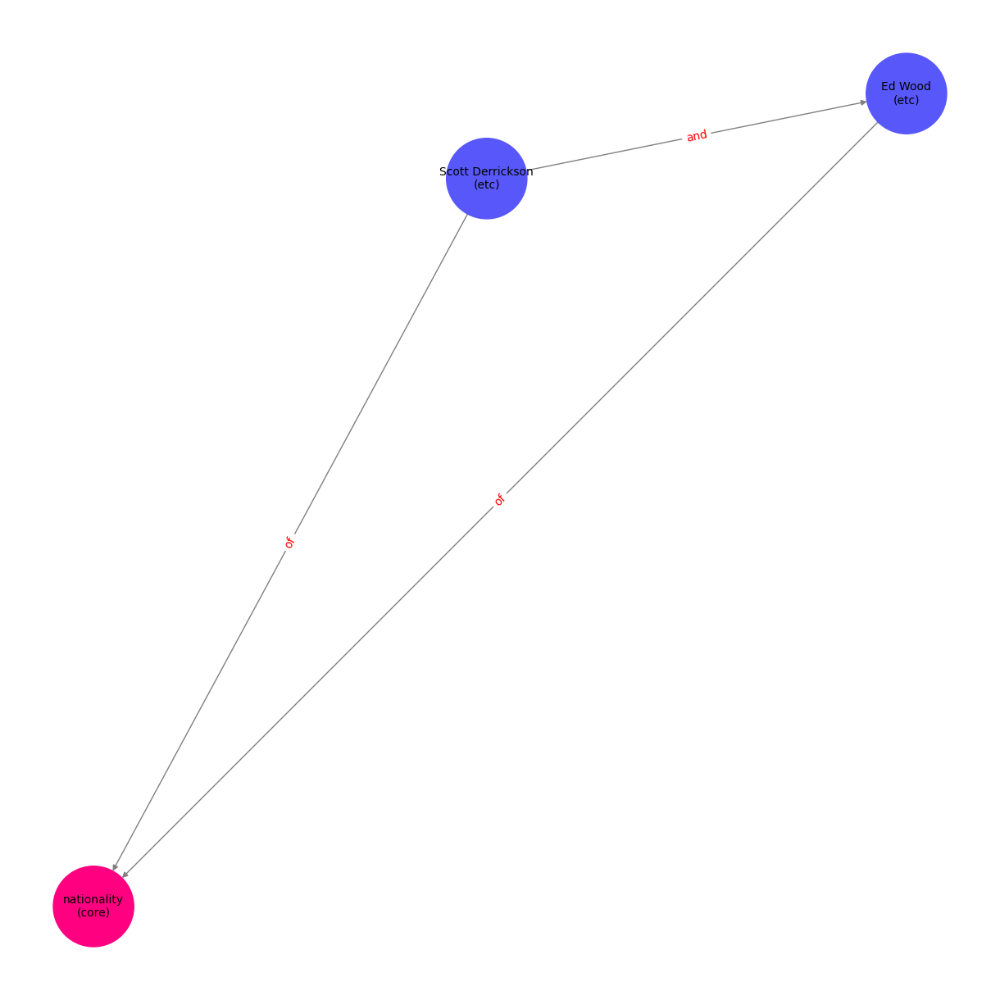

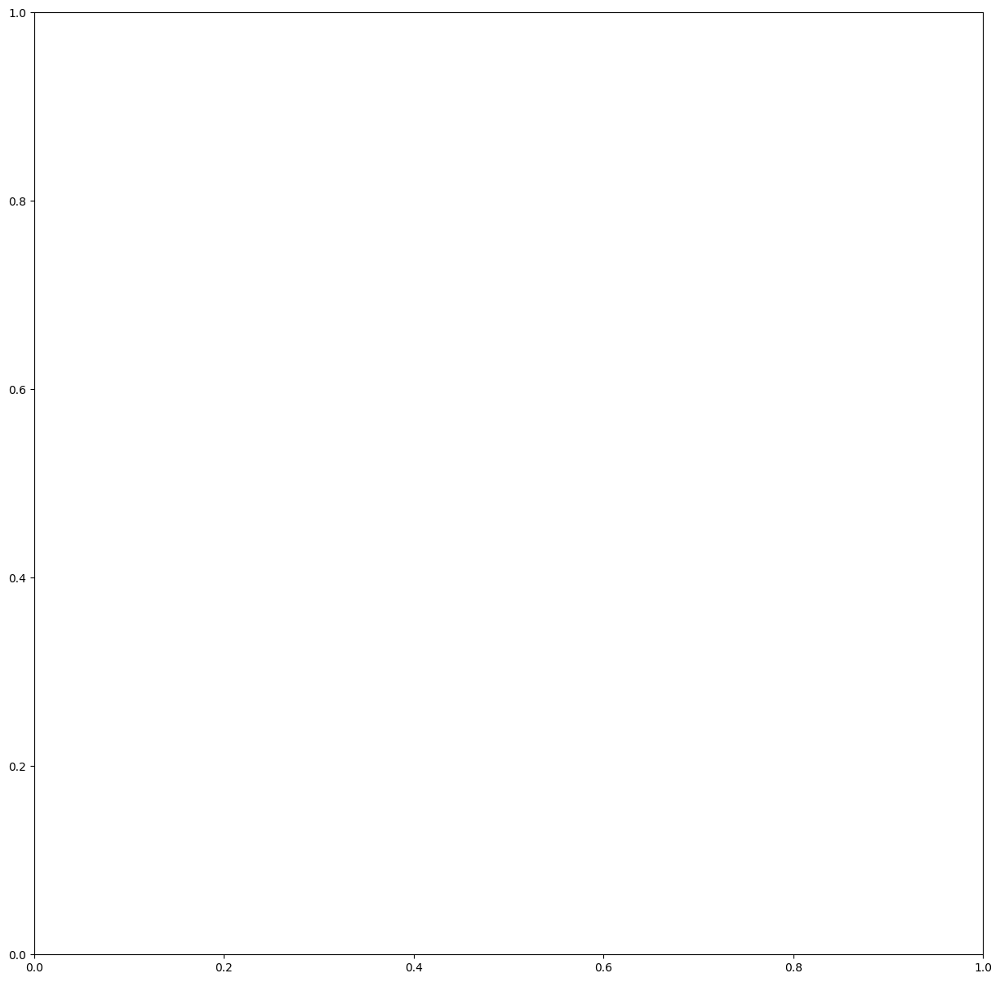

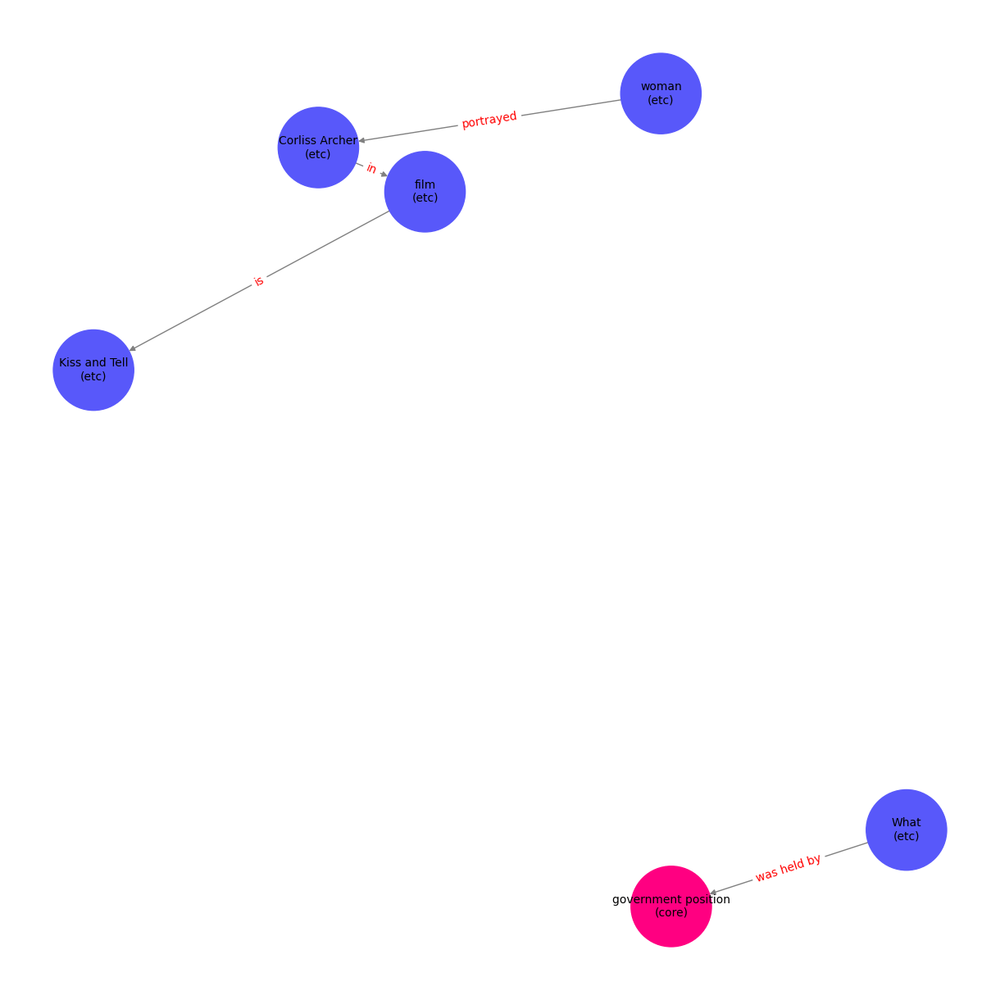

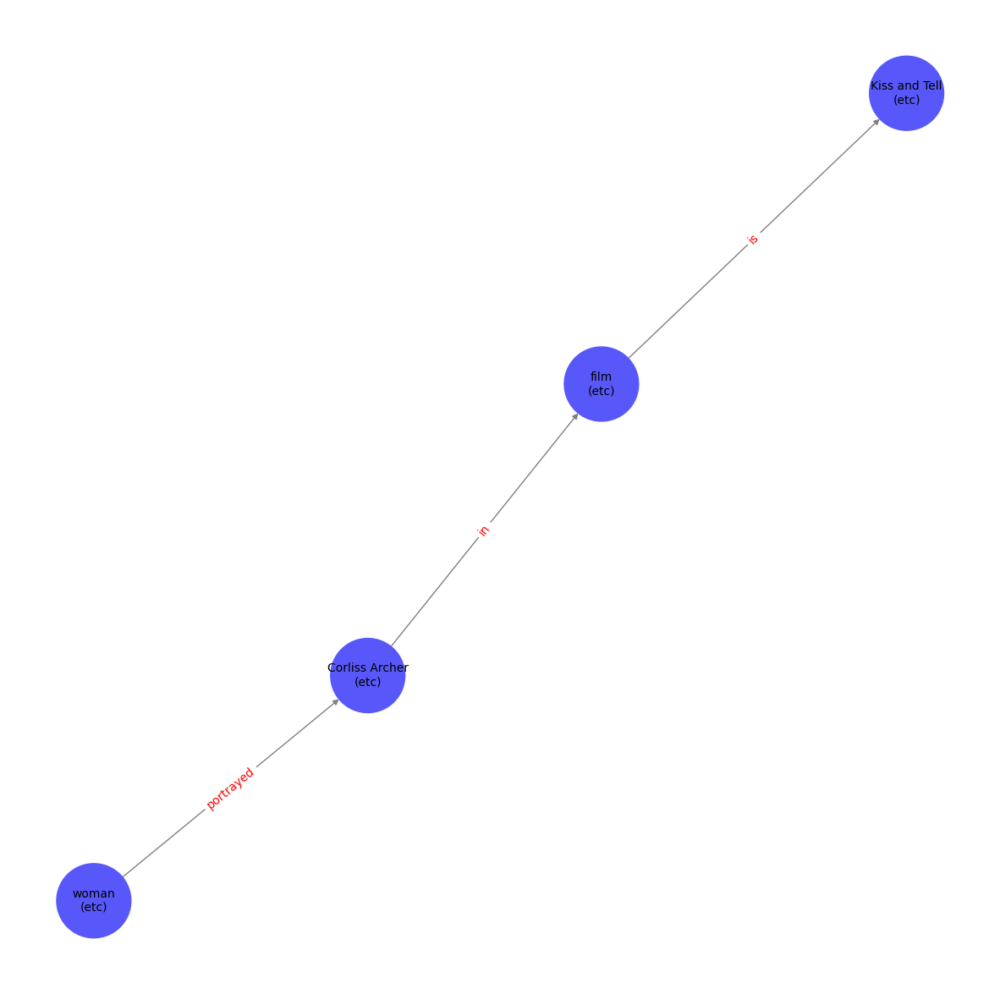

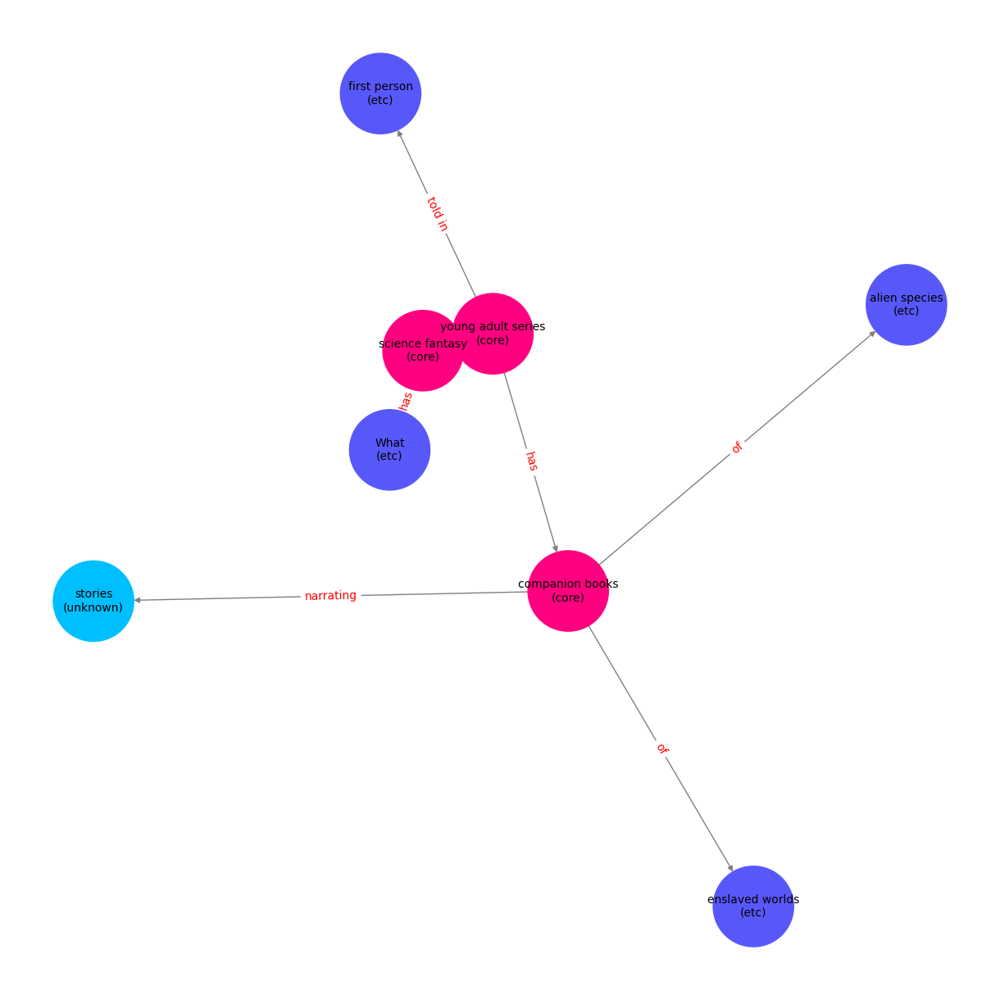

...

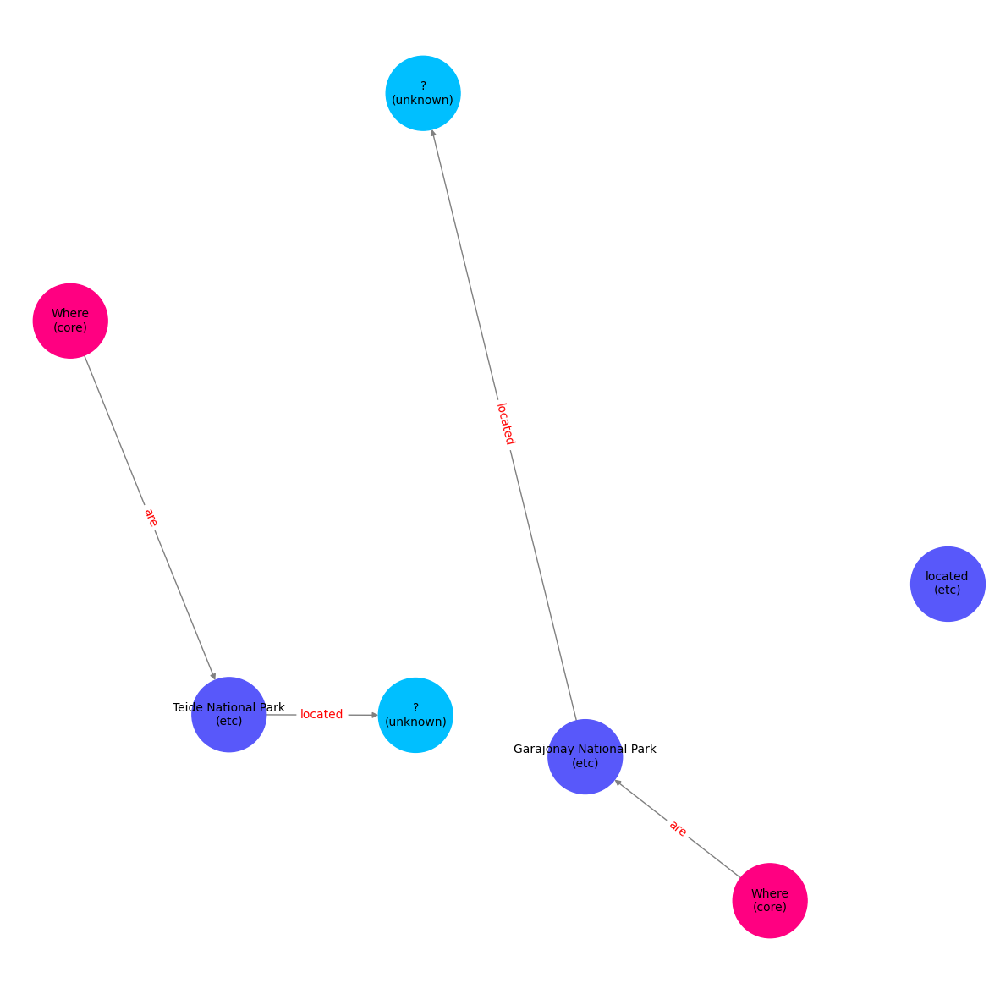

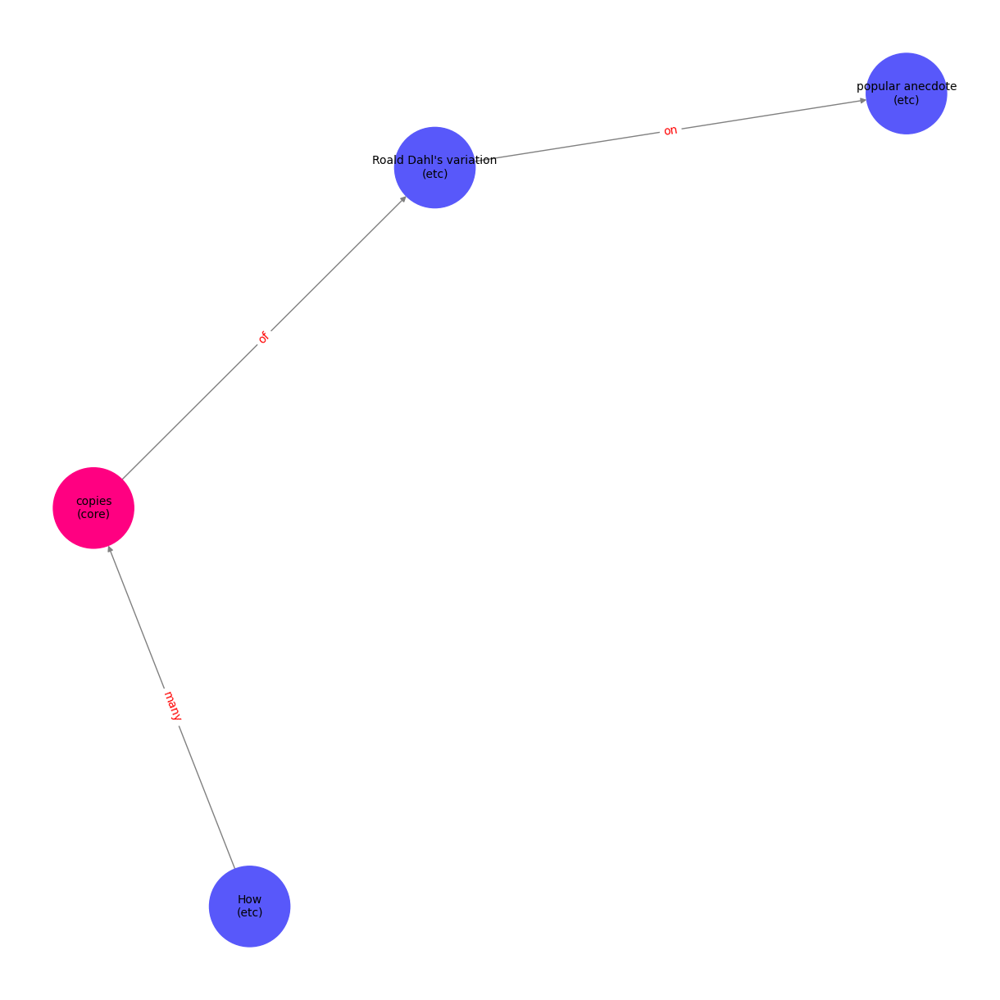

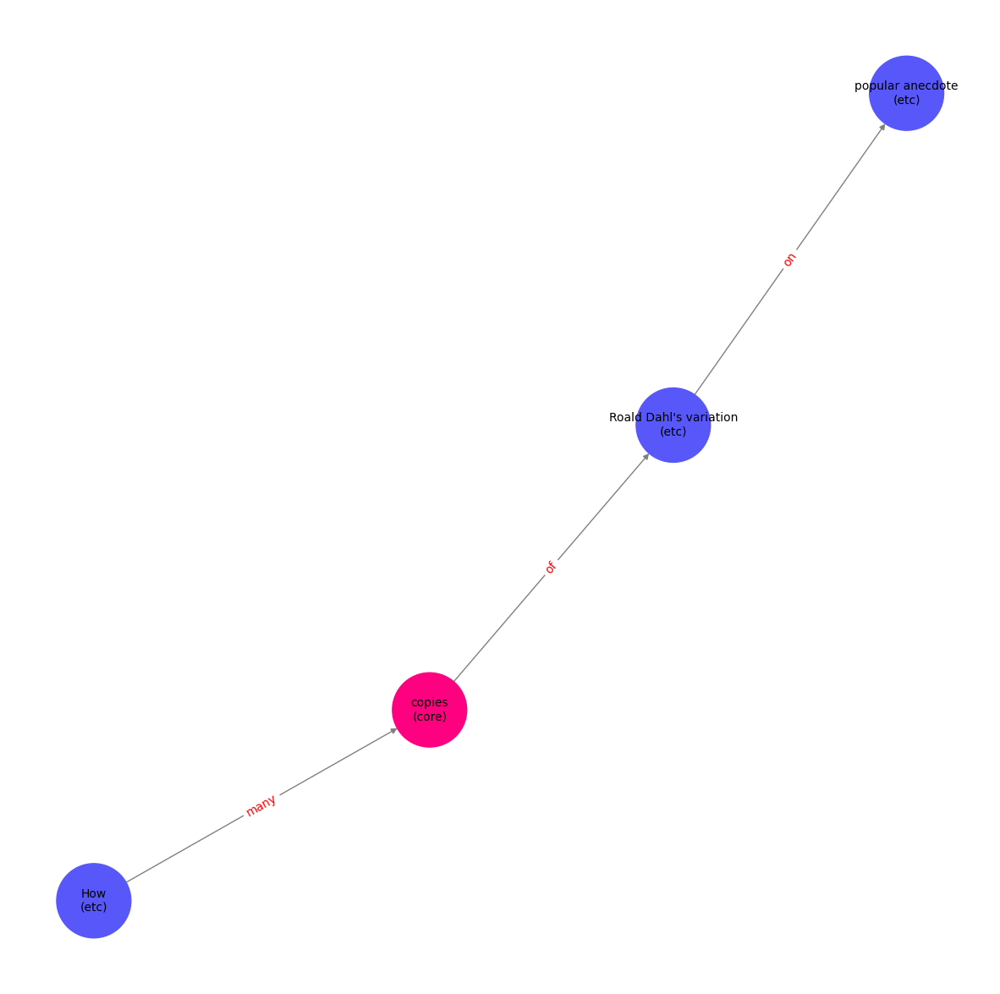

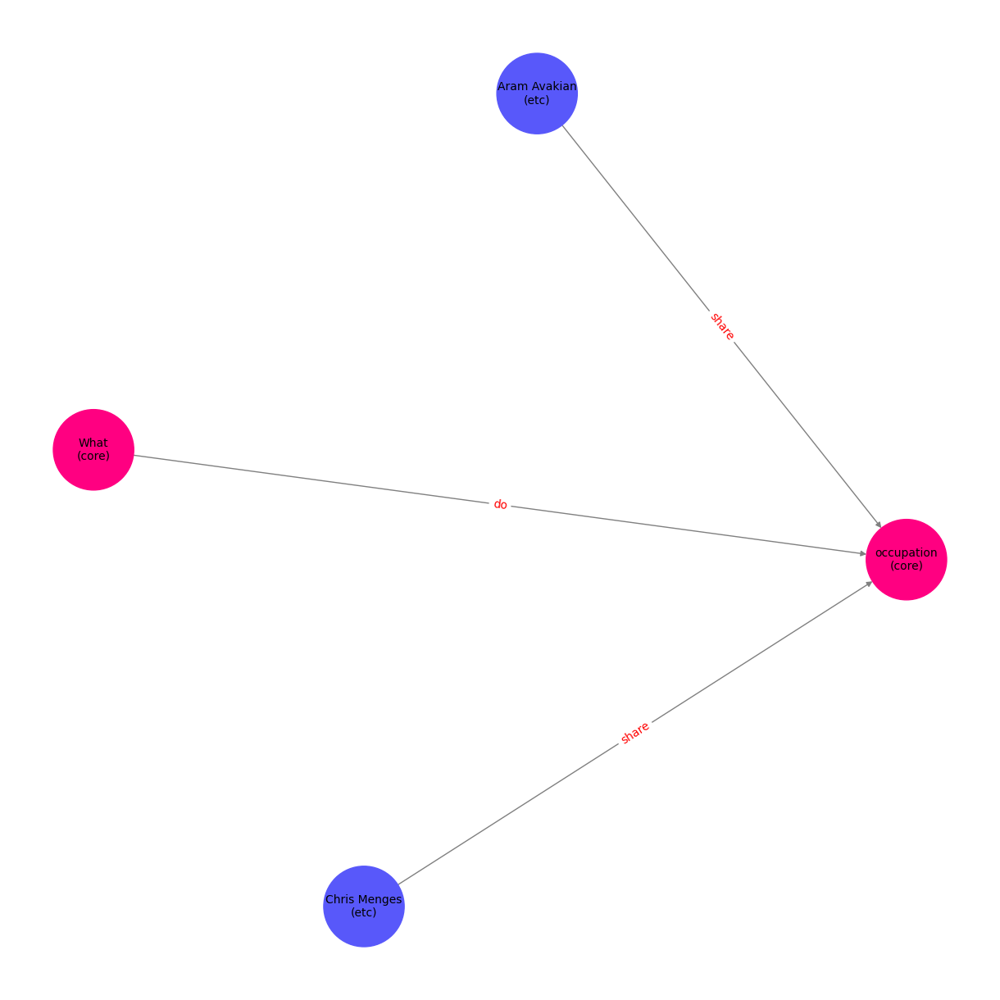

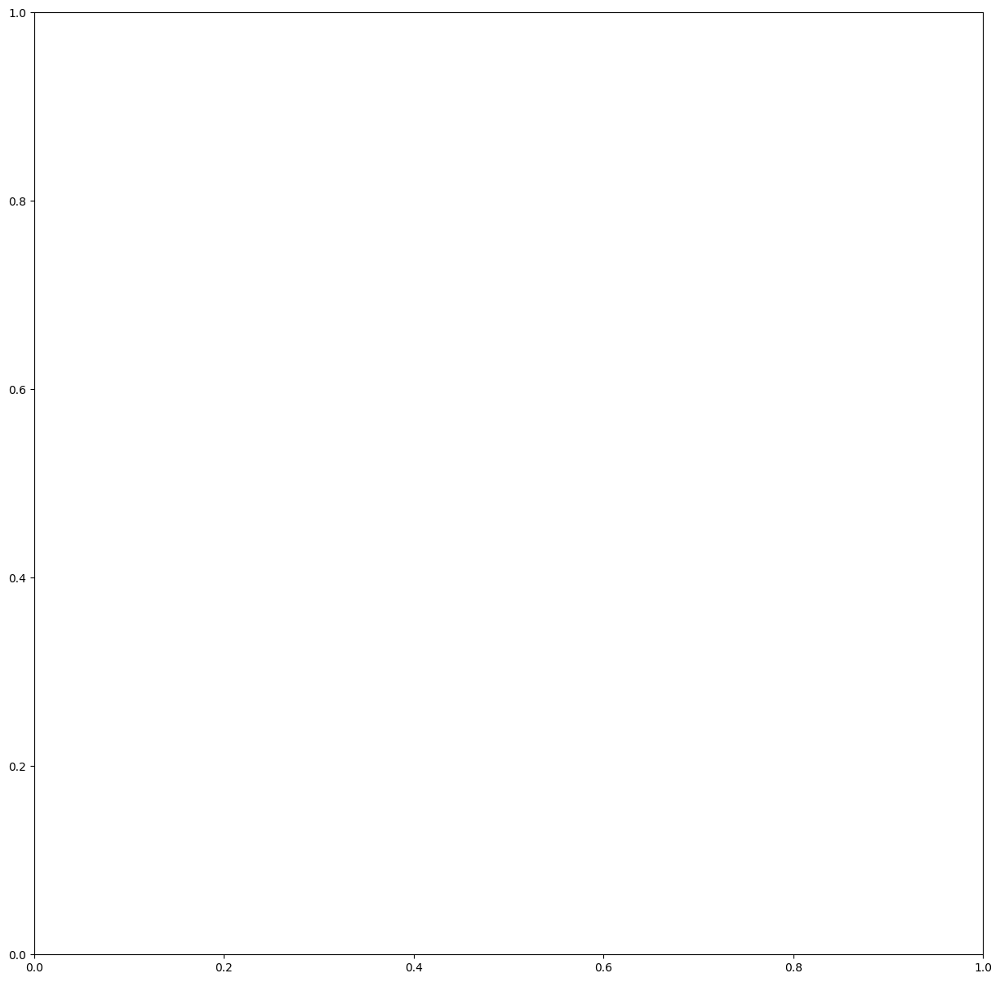

In [ ]:
import time
# import sys
# sys.setrecursionlimit(2000)  # 재귀 가능 기본값은 1000, 필요에 따라 값을 조정

decom_question = []

for query in questions:
  entities = get_entities(query)
  relations = get_re(entities, query)
  rener_json = convert_rener(entities, relations)
  core = get_core(entities, relations, query)
  cores_json = convert_core(core)

  decom_question.extend([query_decomposition(rener_json, cores_json)])
  # time.sleep(5)

  # print(decom_question)

What is the middle name of the actress who plays Bobbi Bacha in Suburban Madness?
{'entities': ['What', 'middle name', 'actress', 'Bobbi Bacha', 'Suburban Madness'], 'relations': [{'subject': 'What', 'relation': 'is', 'object': 'middle name'}, {'subject': 'actress', 'relation': 'plays', 'object': 'Bobbi Bacha'}, {'subject': 'Bobbi Bacha', 'relation': 'in', 'object': 'Suburban Madness'}]}
[('What', 'is', 'middle name')]
[('actress', 'plays', 'Bobbi Bacha'), ('Bobbi Bacha', 'in', 'Suburban Madness')]
['What is middle name', 'The actress plays Bobbi Bacha in Suburban Madness.']


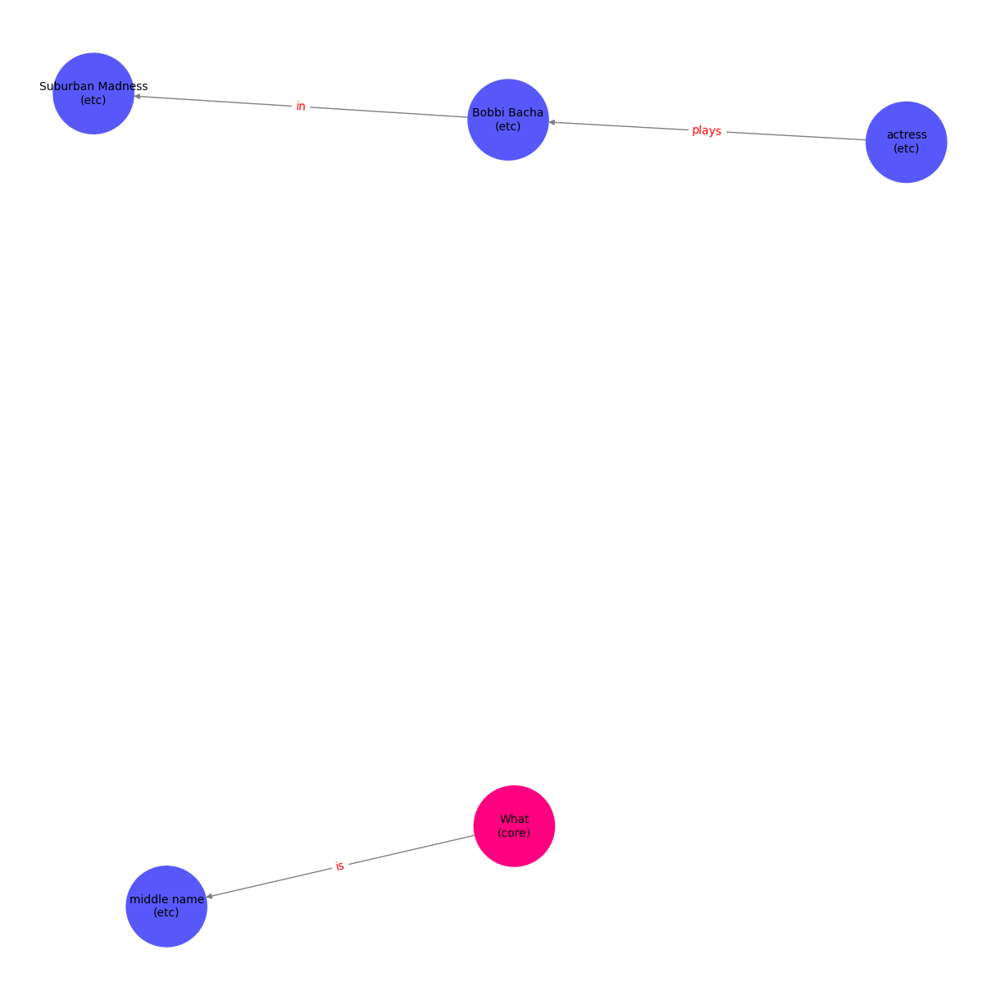

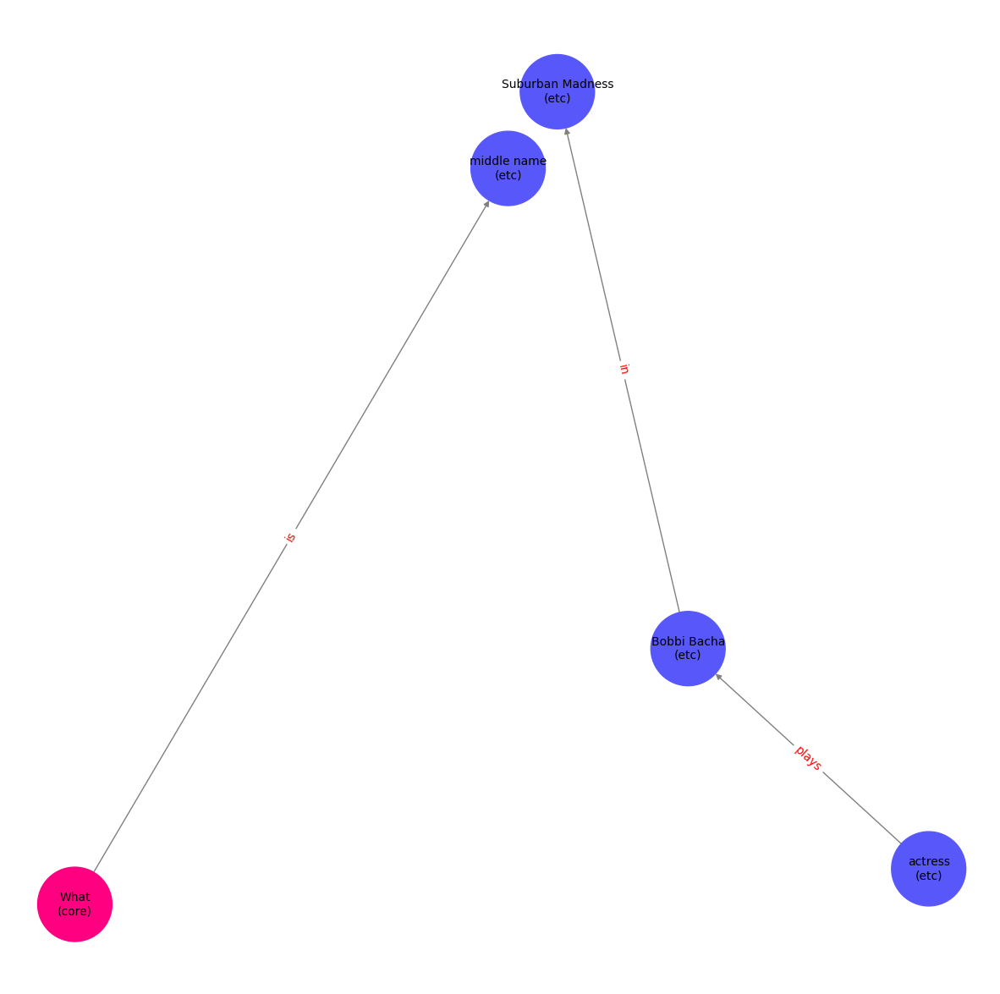

In [ ]:
# TEST

query = questions[76]
entities = get_entities(query)
relations = get_re(entities, query)
rener_json = convert_rener(entities, relations)
core = get_core(entities, relations, query)
cores_json = convert_core(core)

print(query)
print(rener_json)
quries = query_decomposition(rener_json, cores_json)
print(quries)

In [ ]:
print(len(decom_question))

90


In [ ]:
answers = []
contexts = []
query_and_contexts = [[] for _ in range(loop_count)]

for i, queries in enumerate(decom_question):
  temp_contexts = []
  for query in queries:
    t_c = []
    for docs in retriever.get_relevant_documents(query):
      t_c.append(docs.page_content)
      temp_contexts.append(docs.page_content)
    query_and_contexts[i].append({'query': query, 'document': t_c})
  contexts.append(temp_contexts)
  answers.append(rag_chain.invoke({"context": temp_contexts, "question": query}))

<ipython-input-24-c6c099772439>:9: LangChainDeprecationWarning: The method `BaseRetriever.get_relevant_documents` was deprecated in langchain-core 0.1.46 and will be removed in 1.0. Use invoke instead.
  for docs in retriever.get_relevant_documents(query):


In [ ]:
print(len(contexts))
print(len(answers))

print(decom_question[7])
print(contexts)

90
90
['The arena where Lewiston Maineiacs played home games can seat how many people.']
[[], ['for voicing Judy Jetson, Nancy in "Shazzan", Penelope Pitstop, and Josie in "Josie and the Pussycats", and on radio as the title character in "Meet Corliss Archer".Kiss and Tell is a 1945 American comedy film starring then 17-year-old Shirley Temple as Corliss Archer. In the film, two teenage girls', 'A Kiss for Corliss is a 1949 American comedy film directed by Richard Wallace and written by Howard Dimsdale. It stars Shirley Temple in her final starring role as well as her final film appearance. It is a sequel to the 1945 film "Kiss and Tell". "A Kiss for Corliss" was retitled "Almost a Bride"', 'Temple in her final starring role as well as her final film appearance. It is a sequel to the 1945 film "Kiss and Tell". "A Kiss for Corliss" was retitled "Almost a Bride" before release and this title appears in the title sequence. The film was released on November 25, 1949, by United Artists.Cool

<br>

In [ ]:
import spacy
from tqdm import tqdm

# spaCy 모델 로드 (영어 모델)
nlp = spacy.load("en_core_web_sm")

rate_coverages = []

# 엔터티 추출 함수
def extract_entities(text):
    doc = nlp(text)
    entities = set()
    for ent in doc.ents:
        entities.add(ent.text)
    return entities

for i in tqdm(range(loop_count)):
  context_entities = set()
  for text in contexts[i]:
    context_entities.update(extract_entities(text))

  facts_entities = set()
  for fact in loaded_facts_list[i]:
    facts_entities.update(extract_entities(fact))

  # facts_entities 중 context_entities로 커버할 수 있는 엔터티 수 계산
  covered_entities = context_entities.intersection(facts_entities)
  coverage_count = len(covered_entities)

  print(f"Context {i+1}: Extracted entities: {context_entities}")
  print(f"Facts {i+1}: Extracted entities: {facts_entities}")
  print(f"Entities covered from facts by context: {covered_entities}")
  print(f"Number of entities covered: {coverage_count}")
  print(f"Ratio of cover: {coverage_count/len(facts_entities)}")
  rate_coverages.append(coverage_count/len(facts_entities))
  print()

  0%|          | 0/90 [00:00<?, ?it/s]

Context 1: Extracted entities: set()
Facts 1: Extracted entities: {'July 16, 1966', 'American', 'October 10, 1924\xa0', 'Edward Davis Wood Jr.', 'December 10, 1978', 'Scott Derrickson'}
Entities covered from facts by context: set()
Number of entities covered: 0
Ratio of cover: 0.0

Context 2: Extracted entities: {'Shirley Temple', 'Shazzan', 'Nancy', 'Josie', 'Meet Corliss', '1945', 'American', 'Almost a Bride', '1949', 'Corliss', 'Josie and the Pussycats', 'November 25, 1949', 'Penelope Pitstop', 'Richard Wallace', 'Corliss Archer', 'two', 'A Kiss for Corliss', 'Judy Jetson', 'United Artists', 'Kiss and Tell', '17-year-old', 'Howard Dimsdale'}
Facts 2: Extracted entities: {'Shirley Temple', 'Hollywood', 'United States', 'Corliss Archer', 'one', 'American', '1945', 'Ghana', '1935 to 1938', 'February 10, 2014', 'April 23, 1928', 'Shirley Temple Black', 'Czechoslovakia', '17-year-old', 'the United States'}
Entities covered from facts by context: {'Shirley Temple', 'Corliss Archer', 'Amer

  6%|▌         | 5/90 [00:00<00:07, 11.37it/s]

Context 3: Extracted entities: {'six', 'the preceding year', 'Scholastic', 'K. A. Applegate', 'Gail Carriger', 'Square', 'Andre Norton', 'SFWA', 'Katherine Applegate', 'Impulse and SF Impulse', 'Parasol Protectorate', 'Dozens', '1998', 'Science Fantasy', 'British', 'Catherine Asaro', 'Michael Grant', 'first', 'the United States'}
Facts 3: Extracted entities: {'Hork-Bajir', 'Jara Hamee', 'six', 'Scholastic', 'K. A. Applegate', 'Andalite', 'Tobias', 'The Ellimist Chronicles', 'the "', '23', 'Dak Hamee', 'Aldrea', 'Katherine Applegate', 'Animorphs', 'the Hork-Bajir', 'Yeerks', 'second', 'The Andalite Chronicles', 'The Hork-Bajir Chronicles', 'Michael Grant', 'first'}
Entities covered from facts by context: {'Katherine Applegate', 'six', 'Scholastic', 'K. A. Applegate', 'Michael Grant', 'first'}
Number of entities covered: 6
Ratio of cover: 0.2857142857142857

Context 4: Extracted entities: {'English', 'Laleli Camii', 'six', 'mosque', 'Gevheri', 'Rahime Perestu Sultan', 'Turkish', 'the Hag

 10%|█         | 9/90 [00:00<00:06, 12.80it/s]

Context 7: Extracted entities: {'Mary J. Blige', 'May 23, 1977', 'Lanre Dabiri', '1111', 'American', 'Ibn Khaldun', 'Islam', 'Dutch', 'Khalifa bin Zayed Al Nahyan', 'Aladin', 'Makki Makki', 'Unilever', 'Eldee', 'Bengali', 'North Africa', 'European', 'R&B', 'Nigerian-American', 'Muslim', '1994', 'Yousef Al Otaiba', 'Hassan II', '1332-1406', '3 April 1959', 'the Royal Moroccan Academy', 'second', 'Tunisian', 'Berbers', 'Bangladeshi', 'Eenasul Fateh', 'twenty-six years', 'Al-Ghazali'}
Facts 7: Extracted entities: {'Bengali', 'Aladin', 'Bangladeshi', 'Eenasul Fateh', '3 April 1959'}
Entities covered from facts by context: {'Bengali', '3 April 1959', 'Aladin', 'Bangladeshi', 'Eenasul Fateh'}
Number of entities covered: 5
Ratio of cover: 1.0

Context 8: Extracted entities: {'the Quebec Major Junior Hockey League', 'Atlantic', 'Concetta Dwyer Arena', '85 ft.', 'New York', 'the Niagara Purple Eagles', 'Atlantic Hockey', 'Lewiston', 'The Lewiston Maineiacs', '200', '1,400', '9,000', 'Robert', '

 12%|█▏        | 11/90 [00:00<00:06, 11.61it/s]

Context 11: Extracted entities: {'2015', 'Wichita', 'English', 'the Edwards Campus', '1955', 'Rick James', 'American', 'U.S.', '2017', 'more than 16,600', 'Salina', '4', 'up to two', 'Kansas City', 'the Kauffman Center for the Performing Arts', 'Janet Bailey', 'European', 'Leavenworth', 'the University of Missouri', 'three', 'The Importance of Being Icelandic', 'Mount Oread', 'Tres', 'Hays', 'Garden City', 'Eduardo García Maroto', 'Kansas', '3', 'The University of Missouri', 'Overland Park', 'Three', 'Arts', '1940 - 1991', 'Independence Latvian', 'Lawrence', 'Spanish', 'Soviet', 'Parsons', 'Missouri', 'Andy Hare', 'UMKC', 'two', 'Two', 'one', '1998', 'four', 'Topeka'}
Facts 11: Extracted entities: {'the Edwards Campus', 'Mount Oread', 'the University of Kansas', 'Two', 'one', 'Kansas', 'Overland Park', 'Kansas Song', 'Lawrence', 'Kansas City'}
Entities covered from facts by context: {'the Edwards Campus', 'Lawrence', 'Mount Oread', 'Two', 'one', 'Overland Park', 'Kansas', 'Kansas City'

 14%|█▍        | 13/90 [00:01<00:08,  9.13it/s]

Context 12: Extracted entities: {'Peter Fonda', 'Scooby-Doo', '1955', 'Dawn of the', 'Screen', 'American', '1999', 'New Jersey', 'French', 'The Royal Bed', 'Mastroianni', 'George Cukor', 'Janet Bailey', 'Shire', 'The Importance of Being Icelandic', 'Bangkok', 'Tres', 'J. Schaffner', 'San Luis Potosí', 'Eduardo García Maroto', 'David Diamond', 'Richard Outten', '3', 'Menno Meyjes', 'Brett Ratner', 'the following month', '2008', 'Way Back Home', 'Thai', 'Dorothy Arzner', '1951.Bertha', 'A Bill of Divorcement', 'Christopher Coppola', 'Three', 'Snot', '1996', 'Frank Capra', 'Deadfall', 'Pangs', 'Andy Hare', 'James Roland MacLaren', 'Jack Schwartzman', 'Best Actor', 'two', "Stanley O'Toole", 'Tromeo', 'Berkeley Heights', 'Italian', 'Michael Biehn', 'Edward Cline', 'August 1988', 'Best Writing', 'Mexico', 'Rick James', 'The Helmet of Navarre', '4', 'Talia Shire', 'Juliet', 'three', 'August 5', '1879–1958', '2004', 'James Gunn', '13', 'Broadway', 'first', 'Téa Leoni', '17 May 1963', 'Leopoldo

 19%|█▉        | 17/90 [00:01<00:06, 11.16it/s]

Context 15: Extracted entities: {'KCSG', 'Manchester United', 'English', 'Alex Ferguson', 'Phil', 'England', '20 January 1994', 'CBE', 'Paul Scholes', 'The David Beckham Academy', '2005', 'Scottish', 'Longton', '1855', '26 May 1909', 'Neville', 'Manchester City', 'James Ernest Mangnall', 'Nicky Butt', 'Alexander Chapman Ferguson', 'Matthew Busby', 'the second half of the 1970–71 season', 'Staffordshire', 'Joshua Parlby', '4 January 1866', '1986 to 2013', 'Gary', '13 January 1932', 'between 1945 and 1969', 'Manchester', 'Burnley', 'David Beckham', 'the 1890s', '31 December 1941', 'Roy Keane', '2009'}
Facts 15: Extracted entities: {'CBE', 'Manchester United', 'Paul Scholes', 'the start of the season', 'Alex Ferguson', 'Nicky Butt', 'Alexander Chapman Ferguson', 'Paul Ince', 'Mark Hughes', 'Phil', 'David Beckham', '31 December 1941', 'Scottish', '1986 to 2013', 'Andrei Kanchelskis', 'Gary', 'Neville'}
Entities covered from facts by context: {'CBE', 'Manchester United', 'Paul Scholes', 'Al

 22%|██▏       | 20/90 [00:01<00:05, 13.09it/s]

Context 19: Extracted entities: {'M.D.', 'Scientific Affairs', '1974.Roger', 'Dean of', '1982', '13 November 1902', 'the Acting Surgeon General', 'Welfare', 'MD', 'American', '2001 to 2007', 'the United States Department of Health and Human Services', "the University of Southern California's", 'China', 'the Department of Health, Education', 'Nixon', 'Washington', 'the Food and Drug Administration', 'the United States Public Health', '13 September 1997', 'January 22, 2009 to June 25, 2009', 'the Center for Drug Evaluation and Research (CDER', 'Olaf Egeberg', 'Health', 'Edward Dana Martin', 'D.C.', 'the Arthur S. Flemming Award', 'the French Legion of Honor'}
Facts 19: Extracted entities: {'Nixon', 'Dean of', 'Health and Scientific Affairs', '37th', '1974', '1969', 'Welfare', 'the United States', 'U.S.', 'the United States Department of Health and Human Services', "the University of Southern California's", 'April 22, 1994', 'January 9, 1913', 'the Department of Health, Education', 'Richa

 24%|██▍       | 22/90 [00:01<00:05, 12.22it/s]

Context 22: Extracted entities: {'Tigger', 'English', '2010', 'Japanese', '1974', 'Jim', 'Cosmo', 'Sterling Holloway', 'Tigger Too', 'Disney', '2014', 'Kate', 'three', 'Winnie', 'Blustery Day', '1977', 'Fate', 'the Blustery Day', 'Miles', 'Alpha', '"Sailor Moon"', 'first', 'Wanda', 'the many years', 'Saber', 'Sakura Haruno', 'Naruto', 'Omega', 'The Fairly OddParents', 'C.C.', 'Hedgehog', 'Stinky and Lilly', 'Sailor Mercury', 'Tails" Prower in the video game', 'Ami Mizuno', 'Walt Disney', 'Robert & Richard Sherman', 'the Sherman Brothers', 'The Many Adventures of Winnie the Pooh', 'The Many Adventures'}
Facts 22: Extracted entities: {'Robert & Richard Sherman', 'Jim Cummings', 'Pete', 'Robotnik', 'Darkwing Duck', 'Hedgehog'}
Entities covered from facts by context: {'Hedgehog', 'Robert & Richard Sherman'}
Number of entities covered: 2
Ratio of cover: 0.3333333333333333

Context 23: Extracted entities: {'the Siri Remote', 'the Apple Remote', '4K.The', '17 May 1963', 'Front Row', 'Apple In

 27%|██▋       | 24/90 [00:02<00:05, 11.27it/s]

Context 24: Extracted entities: {'Montreux', 'English', 'songwriter Badly Drawn Boy', 'six', 'EP', 'Lesley Woods', 'eight', 'Giants', 'American', 'Damon Gough', 'the San Francisco Symphony', '86', 'Santa Clara', '6', 'Andy Votel', 'The Hour of Bewilderbeast', 'eighteen', 'Thom Yorke', 'the Windham Hill', 'Todd Phillips', 'Badly Drawn Boy', 'Gough', 'first', 'Santa Cruz', '1997', '1987', 'Laura Kipnis', 'more than 170', 'Mike Marshall', 'Alfie', 'Doves', 'Bay Area', 'Richard Ashcroft', '1956', 'Twisted Nerve', 'Manchester', 'Perséphone', 'the early 1980s', 'two', 'Michael Manring', 'one', '26', 'Darol Anger', 'Mike D', 'San Mateo', 'British', 'twenty-one', '26 June 2000', '2000'}
Facts 24: Extracted entities: {'English', 'Michael Gough', 'Ellie Rowsell', '2 October 1969', '2012', 'Theo Ellis', 'Dunstable', 'Joff Oddie', 'Joel Amey', 'Badly Drawn Boy', 'Bedfordshire'}
Entities covered from facts by context: {'Badly Drawn Boy', 'English'}
Number of entities covered: 2
Ratio of cover: 0.18

 32%|███▏      | 29/90 [00:02<00:04, 13.30it/s]

Context 26: Extracted entities: {'10 miles', '1955', 'New Zealand', 'EP', 'Nancy', 'American', 'David Passaro', 'Wali', 'October 1989', '6', 'Linden', '4', 'Croatian', 'Billy Strange', 'early in the morning', "Boots Are Made for Walkin'", 'Andrew Murray', "These Boots Are Made for Walkin'", 'New York State', 'January 22, 1966', 'three', 'The Importance of Being Icelandic', 'the U.S. 82nd Airborne Division', 'Tres', 'Soesdyke-Linden Highway', 'Eduardo García Maroto', '3', 'MINI YU', 'first', 'Asadabad', '100', 'Sinatra', 'Hugo Lewis', 'the age of 28', 'Sunday 27 January 2002', 'May 13, 1928 – June 20, 2007', 'Kunar Province', 'June 21, 2003', 'three days', '1966', 'James A. Shoulders', 'Three', 'Nancy Sinatra', '11', 'CIA', 'Lee Hazlewood', 'Spanish', 'Guyanese', 'Afghanistan', 'US', 'UK', 'These Boots Are Made for Walkin\'"', 'KMFDM', 'Cerar', '1998', 'two consecutive nights', 'four', '1', 'Slovenian', 'One', 'U.S. Army Ranger', 'the United States', '26 December 2001'}
Facts 26: Extrac

 34%|███▍      | 31/90 [00:02<00:04, 11.96it/s]

Context 31: Extracted entities: {'July 19, 1999', '1955', 'August 1988', 'American', 'Mexico', '4', 'French', '200', 'Poison', 'European', 'March 14, 2000', 'three', 'The Importance of Being Icelandic', 'Tres', 'San Luis Potosí', 'Eduardo García Maroto', 'The Longer We Make Love', 'Every Rose Has Its Thorn', '3', 'first', 'Love', 'February 2000', '17 May 1963', 'the following month', 'Blues Saraceno', '131', 'Three', 'Talk Dirty to Me', 'Spanish', 'two', '1998', 'five', 'four', 'Shut Up', 'the United States', '2000'}
Facts 31: Extracted entities: {'Poison', 'Love', 'the mid-1980s to the mid-1990s', 'American', 'Shut Up', 'Crack a Smile', 'first', '2000'}
Entities covered from facts by context: {'Poison', 'Love', 'American', 'Shut Up', 'first', '2000'}
Number of entities covered: 6
Ratio of cover: 0.75

Context 32: Extracted entities: {'7', 'Skyscraper National Park', 'Japanese', 'Badman Recording Co.', 'U.S.', 'La', 'Lunamoth', 'Hardwood Records', 'Arcadia', 'Sadie', 'Duran', 'Fujioka'

 39%|███▉      | 35/90 [00:03<00:04, 11.90it/s]

Context 33: Extracted entities: {'English', 'Paris', 'World War', 'American', 'French', '1937', '5 February 189321 June', 'The White Bird', 'first', 'Nungesser', 'Musée', 'World War I', "L'Oiseau", '1927', 'the City of Paris', 'Coli', 'States Army Air Service', 'Only two', 'Charles Nungesser', 'Moderne de la Ville de Paris', 'Levasseur PL.8', 'the Orteig Prize', 'François Coli', 'William Earl Johns', 'New York City', '17', 'one', "L'Oiseau Blanc"}
Facts 33: Extracted entities: {'15 March 1892', 'Charles Eugène', 'Charles Lindbergh', 'World War', 'Marie Nungesser', '8 May 1927', 'Charles Nungesser', 'French', 'François Coli'}
Entities covered from facts by context: {'World War', 'French', 'François Coli', 'Charles Nungesser'}
Number of entities covered: 4
Ratio of cover: 0.4444444444444444

Context 34: Extracted entities: set()
Facts 34: Extracted entities: {'Kevin Anderson', '2010', 'the late 1980s', 'early 1990', 'Freakonomics: A Rogue Economist Explores', 'Stephen J. Dubner', 'Austra

 41%|████      | 37/90 [00:03<00:04, 10.73it/s]

Context 36: Extracted entities: {'1955', 'six', 'Russian', 'May 1881', 'Kornilov', 'Power of Three', 'the Imperial Russian Army', 'the February Revolution of 1917', '4', 'Russian Civil War', 'Alexander Fyodorovich Kerensky', 'African-American', 'Bolshevik', 'three', 'The Importance of Being Icelandic', 'the Kornilov Affair', 'Tres', '11 June 1970', 'Eduardo García Maroto', 'George B. McClellan', 'July 1, 1862', 'first', '3', 'soviets', 'World War I', 'Republican', 'August/September 1917', 'Potomac', 'Robert E. Lee', 'the Seven Days', 'Фёдорович', '130', 'the Russian Revolution of 1917', '1940', 'Democrat', 'June 25 to July 1, 1862', 'Three', 'Army', 'Russian Provisional Government', 'the American Civil War', 'the Civil War', 'Richmond', 'Spanish', 'Navy', 'Kerensky', 'San Francisco', 'Union Army', 'today', 'the Confederate Army of Northern Virginia', 'the Union Army', 'the seven days', 'Confederate', '1998', "Alexander Kerensky's Provisional Government", 'Millions', 'Virginia'}
Facts 3

 44%|████▍     | 40/90 [00:03<00:03, 13.29it/s]

Context 40: Extracted entities: {'Southern', 'the American Psychological Association', 'Ralph Franklin Hefferline', 'Columbia', 'the International Society of Mental Health Online', '15 February 1910', 'Muncie', 'Indiana', '16 March 1974', 'Funder', 'the University of California, Riverside', 'the "Southern Literary Journal', '1968', 'North Carolina Chapel Hill', 'the "Journal of Research and Personality', 'the National Humanities Center', '1966', 'the Pennsylvania Psychological Association'}
Facts 40: Extracted entities: {'Columbia', 'Ralph Franklin Hefferline', '16 March 1974', 'Indiana', 'Muncie', '15 February 1910', 'Columbia University', 'New York City', '1754', 'one', 'the City of New York', 'Upper Manhattan'}
Entities covered from facts by context: {'Columbia', 'Ralph Franklin Hefferline', '16 March 1974', 'Indiana', 'Muncie', '15 February 1910'}
Number of entities covered: 6
Ratio of cover: 0.5

Context 41: Extracted entities: {'English', 'the Toy Group', 'the American Kennel Clu

 49%|████▉     | 44/90 [00:03<00:04, 10.99it/s]

Context 42: Extracted entities: {'Annual', 'Datapad', 'Sachin Bansal', 'Movieline', 'Young Hollywood Awards', '1955', 'August 1988', 'NY', 'Mexico', 'Germany', 'New York', 'Murray Hill', 'India.com', 'New Jersey', '4', 'French', 'Kerala', '2014', 'Malayalam', 'Massachusetts', 'India', 'the Year Awards', '15th', 'NY411', 'African-American', 'three', 'Indian Institute of Technology Delhi', 'Oregon', 'The Importance of Being Icelandic', 'Flipkart', 'the United Kingdom', 'Tres', 'Python for Data Analysis', 'LA411', 'TVLine', 'San Luis Potosí', 'Eduardo García Maroto', 'Los Angeles', '3', 'the United States', '17 May 1963', 'Indian Software', 'the following month', 'Japan', 'Cloudera', 'Sachin Warrier', 'April 23, 1933 – June 25, 2011', 'California', 'Muthuchippi Poloru', '5 August 1981', 'Three', '11', 'Schrödinger', 'France', 'Spanish', 'Two Sigma Investments', 'AwardsLine', 'New York City', 'Breakthrough', '@Hollywood', 'Clean Power Finance', 'San Francisco', 'Malarvaadi Arts Club', 'two

 51%|█████     | 46/90 [00:04<00:04, 10.89it/s]

Context 45: Extracted entities: {'Walter Cronkite', 'Affirmative Action', 'Committee', 'The Challenge of Journalism', 'Committee on the Employment of Minority Groups', "Nelson Rockefeller's", 'National News Council', 'Lyndon Johnson', "the Twentieth Century Fund's", 'Committee on the', 'New York', 'Labor', 'Arthur Goldberg', 'first', 'Committee on Equal Employment Opportunity'}
Facts 45: Extracted entities: {'Walter Cronkite', 'The Challenge of Journalism', 'Alfred Balk', 'Committee on the Employment of Minority Groups', 'January 26, 1979', "Nelson Rockefeller's", 'National News Council', 'Illinois', 'American', "the Twentieth Century Fund's", 'New York', 'Nelson Aldrich Rockefeller', 'November 25, 2010', 'July 24, 1930 –', 'the Nation of Islam', 'July 8, 1908 –'}
Entities covered from facts by context: {'Walter Cronkite', 'The Challenge of Journalism', 'Committee on the Employment of Minority Groups', 'National News Council', "Nelson Rockefeller's", "the Twentieth Century Fund's", 'Ne

 53%|█████▎    | 48/90 [00:04<00:04,  9.72it/s]

Context 47: Extracted entities: {'mid-1960s', 'Star of the County Down', 'Neil Gaiman', '1955', 'August 1988', 'Teen', 'American', 'Mexico', '4', 'French', 'Bangladesh', 'three', 'The Importance of Being Icelandic', '1970', 'Tres', 'San Luis Potosí', 'Eduardo García Maroto', 'Beatles', 'Josh Osborne', '3', 'first', 'Pebbles Box', '17 May 1963', 'the following month', 'Warner Brothers', '5 vinyl LPs', 'Living in the', '2013', 'Three', 'ZZ Top', '2006', 'Spanish', 'US', 'All Things Must Pass', 'Jane Yolen', 'Tommy Lee James', 'UK', 'Trash Box', 'two', '1998', 'ten', 'Alan Moore', 'Mono', '5', '1970-1990', 'Lily', 'Andrew Dorff'}
Facts 47: Extracted entities: {'1991', 'ABKCO', 'Phil Spector', '5 vinyl LPs', 'Love Him', '1958', 'Spector', 'the 1960s', '4', 'the Teddy Bears', 'first'}
Entities covered from facts by context: {'5 vinyl LPs', 'first', '4'}
Number of entities covered: 3
Ratio of cover: 0.2727272727272727

Context 48: Extracted entities: {'March 2011', 'Stalin', 'six', 'April 19

 58%|█████▊    | 52/90 [00:04<00:03, 10.39it/s]

Context 50: Extracted entities: {'Air Ministry', 'the Royal Air Force', 'Malayan', 'late 1940s', 'World War II', 'Electric Canberra', 'Royal Australian Air Force', 'RAF', '1944', 'May 1951', 'English Electric Canberra', '1937', 'the 1950s', 'RAAF', 'British', 'only a couple of months', 'the South West Pacific', 'English Electric', 'first', '1922'}
Facts 50: Extracted entities: {'English Electric Canberra', 'The English Electric Canberra', 'the Vietnam War', 'the 1950s', 'the Malayan Emergency', 'the South West Pacific', 'World War II', 'British', 'first'}
Entities covered from facts by context: {'English Electric Canberra', 'the 1950s', 'the South West Pacific', 'World War II', 'British', 'first'}
Number of entities covered: 6
Ratio of cover: 0.6666666666666666

Context 51: Extracted entities: {'the National Hockey League', '12–11', '193', 'First', "Men's Division I Basketball Tournament", 'the Metro Conference', 'Hofstra', 'the season 20–14', 'the America East', 'University', 'Four', 

 60%|██████    | 54/90 [00:04<00:03, 10.28it/s]

Context 53: Extracted entities: {'500 mile', '1936', 'August every year', 'the 1940s', 'the years', '4', 'the Carolina 500', '1966 to 1995', 'Ray Bryson', '400 mile', 'mid-1850s', '19', 'three', 'The Rock', 'Johnny', 'a half-mile', 'Subway', '500-mile', 'America', 'North Carolina', '16\xa0degrees', 'the Black', 'Southern 500', '5/8-mile', '500', '1986–1995', '1966', '805-km', '1996', '3/8-mile', 'The Lean Horse Ultramarathon', '1870', 'a 3/4 mile', 'Dodge', 'one', 'the Harry Clay Oval', 'the Goodwrench 500', '1983', 'John Sherman', 'Darlington'}
Facts 53: Extracted entities: {'Indianapolis', 'Indiana', 'Speedway', 'The Indianapolis Motor Speedway', 'the Indianapolis Motor Speedway', 'May 30, 1957', 'Thursday', '41st', 'the United States'}
Entities covered from facts by context: set()
Number of entities covered: 0
Ratio of cover: 0.0

Context 54: Extracted entities: {'Italian', 'La bohème de Puccini', '1,021,717', "Giacomo Puccini's", 'May 8, 1863', 'North Kansas City', 'Giovacchino For

 64%|██████▍   | 58/90 [00:05<00:02, 11.15it/s]

Context 56: Extracted entities: {'1955', '12\xa0km', 'London', 'August 1988', 'Sydney', 'Mexico', '4', 'French', 'three', 'The Importance of Being Icelandic', 'High School', 'March 1922', 'the United Kingdom', 'Tres', 'South Australia', 'San Luis Potosí', 'Eduardo García Maroto', '3', 'first', 'Robert Menzies', 'Tamworth', '17 May 1963', 'the following month', '1961', 'The High Commission', 'no day', 'James Ruse Agricultural High School', 'Marion', 'Three', 'Adelaide', 'New South Wales', 'Grade II', 'House', 'Spanish', 'two', '1978', 'Australia', '1998', 'Methodist', 'Westminster School', 'Hurlstone Agricultural High School'}
Facts 56: Extracted entities: {'Uniting Church', '1961', 'the City of Marion', '1838', '12\xa0km', 'London', '10\xa0km', 'Marion', 'Early Learning', 'Methodist', 'South Australia', 'Adelaide', 'Westminster School', 'the Sturt River', 'Robert Menzies'}
Entities covered from facts by context: {'1961', '12\xa0km', 'London', 'Marion', 'Methodist', 'South Australia', '

 70%|███████   | 63/90 [00:05<00:02, 10.74it/s]

Context 61: Extracted entities: {'the Year Award', 'the Charlotte Hornets', '1955', 'American', 'Allan Bristow', 'Danish', 'Second-year', '11.0', 'North', 'Johnson', 'The Importance of Being Icelandic', 'Tres', 'NBA', 'Eduardo García Maroto', '3', 'North Carolina', 'Hornets', '1988–2002', 'fourth season', 'the Central Division', 'Mark Price', 'Eastern Conference Southeast Division', 'the National Basketball Association', '31', 'the United States Intelligence', 'Three', 'New Orleans', 'Bob Weiss', 'The National Intelligence Medal of Achievement', '1992', 'Distinguished Intelligence Cross', 'two', 'Cerar', 'Michael Jordan', 'The Five Obstructions', 'Charlotte Sting', 'MINI YU', 'Slovenian', 'One', 'Jørgen Leth', '2010', '51', 'Stephen Silas', 'the 20th century', '14-season', 'the Southeast Division', '25th season', 'Steve Clifford', 'Charlotte', 'ten seasons', 'May 20, 2014', 'Toronto Raptors', '6', '4', "the Charlotte Hornets'", 'Croatian', '19.2', "the Central Intelligence Agency's", '

 72%|███████▏  | 65/90 [00:05<00:02, 11.21it/s]

Context 64: Extracted entities: {'Lazy Mary, Will You Get Up', '1997', '2nd Ed', 'two', '394', 'The Wheels on the Bus', 'John Byrom', '7882', '19800'}
Facts 64: Extracted entities: {'821', 'What Are Little Boys Made Of', 'fourth', 'the 19th century'}
Entities covered from facts by context: set()
Number of entities covered: 0
Ratio of cover: 0.0

Context 65: Extracted entities: {'Texas', 'Las Vegas', 'Chile', 'Standard Oil Company', '340', 'Colombia', 'Norway', 'American', 'Mexico', 'Iraq', '1999', 'New Jersey', 'China', 'Bank of America', 'Tokyo', 'India', 'Halliburton', 'Teleperformance', '1972', 'the United Kingdom', 'Guyana', 'Canada', 'Los Angeles', 'Exxon Corporation', 'Rising Tide North America', 'Garland', 'Exxonmobil', 'Albania', 'Greece', 'Localeur', 'Costa Rica', '2006', 'Citibank', 'Philippines', 'France', 'Dubai', '74', 'the Keystone XL Pipeline', 'Boris Abramovich', 'New York City', '160', 'Brazil', 'the Houston Global Awareness Collective', 'the Rainforest Action Network'

 77%|███████▋  | 69/90 [00:06<00:01, 12.50it/s]

Context 67: Extracted entities: set()
Facts 67: Extracted entities: {'The International Boxing Federation', 'the International Boxing Hall of Fame', 'World Boxing Council', 'IBF', 'Kostya Tszyu', 'WBA', 'one', 'four', '1999', 'World Boxing Organization', 'WBC', '1997 to', 'the World Boxing Association'}
Entities covered from facts by context: set()
Number of entities covered: 0
Ratio of cover: 0.0

Context 68: Extracted entities: {'Carlos Santana', 'Edward "Eddie F"', '13, 1999', 'Say Say Say', 'Windham Hill', 'Grammy', 'two consecutive weeks', 'Christy Sutherland', 'Michael Jackson', '44', 'Billboard', 'fifteen weeks', 'eight consecutive weeks', '200', 'Nashville', 'the 1980s', 'the United Kingdom', 'Paul McCartney', 'ID3', '3', 'first', 'number 2', '100', '12', '19 consecutive weeks', 'number seven', 'the "Billboard" Hot 100', 'Barbara Higbie', '1958', 'Platinum', '1957', 'April 9, 1976', 'No.1', '1956', 'number one', '1992', 'US', 'UK', 'four weeks', 'ten', '1959', 'the United State

 79%|███████▉  | 71/90 [00:06<00:01, 13.39it/s]

Context 70: Extracted entities: {'English', 'Wigan', 'the Football League Second Division', 'the Football League', 'under-21', '2004–05', 'Wigan Athletic', '30th season', '2nd', 'the Premier League', 'Wigan Athletic F.C.', '29th season', 'Greater Manchester', 'JJB Stadium', 'the Northern Premier League', '2007–08', 'their second season', 'Springfield Park', 'under-17', 'The 1978–79 season', 'the Football League Championship', 'the 41st season', 'the previous season', 'under-18', 'first', 'under-19'}
Facts 70: Extracted entities: {'English', 'the League Cup', 'EFL Cup', 'The EFL Cup', 'EFL Trophy', 'the Carabao Cup', 'annual', 'the FA Cup'}
Entities covered from facts by context: {'English'}
Number of entities covered: 1
Ratio of cover: 0.125

Context 71: Extracted entities: {'Roy', 'Tara Strong', 'Titans', 'American', 'Tara Lyn Charendoff', 'February 12, 1973', 'Canadian', 'Hynden Walch', 'the Justice League', 'Outsiders', 'Seven', 'Greg Cipes', 'Warner Bros. Animation', 'Khary Payton'

 81%|████████  | 73/90 [00:06<00:01, 11.54it/s]

Context 73: Extracted entities: {'June 24', 'National Wear', '26 April', 'Japanese', 'Kodomo', 'May 5', 'Koningsdag', 'the Wob Dwiete', 'Belize', 'Sunday', 'Dutch', 'the 27th', 'Garifuna Settlement Day', 'Canadian', 'the Kingdom of the Netherlands', 'French', "King's Day", 'Mon Repos', 'King Willem-Alexander', 'Netherlands', 'the House of Orange-Nassau', '27 April', 'November 19', 'each year', 'Madras', 'annually', 'the United States'}
Facts 73: Extracted entities: {'Dutch', 'the House of Orange-Nassau', 'the Kingdom of the Netherlands', "King's Day", 'Koningsdag'}
Entities covered from facts by context: {'the House of Orange-Nassau', 'Koningsdag', 'Dutch', 'the Kingdom of the Netherlands', "King's Day"}
Number of entities covered: 5
Ratio of cover: 1.0



 83%|████████▎ | 75/90 [00:06<00:01, 10.13it/s]

Context 74: Extracted entities: {'Baz Luhrmann', '1955', 'Nesbitt', 'Romio', '1982', 'Blanche Baker', 'August 1988', 'Scooby-Doo', 'Dawn of the', 'American', 'Mexico', '4', 'French', 'Juliet', '2014', 'Montague', 'Romeo ×', 'European', 'Alex Hyde-White', '2007', 'North American', 'three', 'Romeo', 'The Importance of Being Icelandic', 'Kaufman', 'August 5', 'Craig Pearce', 'Tres', 'Leonardo DiCaprio', '2004', 'San Luis Potosí', 'Eduardo García Maroto', 'James Gunn', '3', 'first', 'Irmis', "William Shakespeare's", 'Claire Danes', 'Shakespeare', 'Lloyd Kaufman', 'William Woodman', '2', '17 May 1963', 'the following month', 'Romeo & Juliet', 'Three', '1940 - 1991', 'Independence Latvian', 'Parker', 'The Tragedy of Romeo', '1996', 'Spanish', 'Soviet', 'Gabriella Martinelli', '2002', 'two', 'Troma Entertainment', '1998', 'Tromeo', 'the mid-1990s', 'Jurietto'}
Facts 74: Extracted entities: {'Scooby-Doo', '2002', 'Juliet', 'Romeo & Juliet', 'American', 'Troma Entertainment', 'Tromeo', '2004', 

 88%|████████▊ | 79/90 [00:07<00:01, 10.99it/s]

Context 77: Extracted entities: {'Texas Private Investigator', 'Galveston', 'Texas', 'English', 'Sony Pictures Movie', 'Sela Ward', '2004.Latvian', 'Galveston County', 'American', 'New York', 'Morris Black', 'October 3', 'Suburban Madness', 'Robert Durst', 'European', 'Connecticut College', 'Muslim', 'Bacha', '2016', 'Blue Moon Investigations', 'CBS', '2004', 'British', 'African'}
Facts 77: Extracted entities: {'Texas Private Investigator', "the early '80s", 'July 11, 1956', 'Sela Ward', 'Sela Ann Ward', 'Bacha', 'American', '2004', 'Suburban Madness'}
Entities covered from facts by context: {'Texas Private Investigator', 'Sela Ward', 'Bacha', 'American', '2004', 'Suburban Madness'}
Number of entities covered: 6
Ratio of cover: 0.6666666666666666

Context 78: Extracted entities: {'Embassy', 'Florida', 'a "Period of Friendship', 'the 18th century', 'Today', '17th-century', 'St. Augustine', 'the east coast', 'Indians', 'African-American', 'Oklahoma', 'Bolivia', 'Creeks', 'Alabama', 'thre

 90%|█████████ | 81/90 [00:07<00:00, 11.55it/s]

Context 80: Extracted entities: {'eight months later', 'George V', 'Ceylon', '1965', 'Pakistan', 'New Zealand', 'King George VI', 'Belize', '1951', '1 June 1951', 'Australia', 'Commonwealth', 'daily', 'Saint Lucia', '1925', 'the British Empire', 'George VI'}
Facts 80: Extracted entities: {'India', '6 May 1910', 'George V', '1936', '20 January 1936', 'the United Kingdom', 'George Frederick Ernest Albert', 'the British Dominions', '3 June 1865', '1925', 'the British Empire'}
Entities covered from facts by context: {'1925', 'George V', 'the British Empire'}
Number of entities covered: 3
Ratio of cover: 0.2727272727272727

Context 81: Extracted entities: {'Gardnerville', '1,154', 'Miner Memorial Library', '2010', 'Springfield', 'New England', '1845', 'Hampshire County', 'Universalist', 'New Hampshire', 'Northampton', "Hampshire County's", 'North Haverhill', 'U.S.', 'Second', '6,306', 'Massachusetts', '1794', 'Washington', '1792', 'Vermont', '1812', 'Guildhall', 'East Lempster', 'Essex Coun

 94%|█████████▍| 85/90 [00:07<00:00, 11.01it/s]

Context 83: Extracted entities: {'Congress', '17 May 1963', '1981', 'the Supreme Court', '1955', 'the following month', 'Bernard D. Rostker', 'August 1988', 'Mexico', 'U.S.', '6', '4', 'French', 'Three', 'the Selective Service System', 'Spanish', 'Rostker', '16 September', 'three', 'Goldberg', 'two', 'Robert L. Goldberg', 'The Importance of Being Icelandic', 'Tres', '1998', 'the United States Supreme Court', 'San Luis Potosí', '453', 'Eduardo García Maroto', '3', 'the United States'}
Facts 83: Extracted entities: {'World War I', 'the United States Armed Forces', '1981', 'Rostker', 'Goldberg', 'the United States', '1973', 'four', 'U.S.', 'the United States Supreme Court', 'World War II', '1940', '453', 'Korean', 'Vietnam Wars', 'the American Civil War', 'the Cold War'}
Entities covered from facts by context: {'1981', 'Rostker', 'Goldberg', 'U.S.', 'the United States Supreme Court', '453', 'the United States'}
Number of entities covered: 7
Ratio of cover: 0.4117647058823529

Context 84: 

 97%|█████████▋| 87/90 [00:07<00:00, 11.71it/s]

Context 86: Extracted entities: set()
Facts 86: Extracted entities: {'Jared Kushner', 'Trump Tower', 'Donald TrumpDonald Trump Jr.', 'at least five', 'New York City', 'three', 'Russian', 'June 9, 2016', 'American', 'Paul John Manafort Jr.', 'April 1, 1949', 'Natalia', 'Paul Manafortand'}
Entities covered from facts by context: set()
Number of entities covered: 0
Ratio of cover: 0.0

Context 87: Extracted entities: {'Blue Passersby Eyes', 'English', 'Italian', '1936', 'Ennio Flaiano', '1955', 'August 1988', 'Buckskin Brigades', 'American', 'Mexico', 'Ethiopia', "Mara Alper's", 'A Arte de Produzir Efeito Sem Causa', '4', 'French', '26 August', '2014', 'Lourenço Mutarelli', 'Selton Mello', 'the Locarno International Film Festival', 'Marco Dutra', 'Haiti', 'three', 'The Importance of Being Icelandic', '2007', 'Tres', 'July 2002', 'San Luis Potosí', 'Scottish', 'Eduardo García Maroto', 'Port-au-Prince', '3', 'first', 'Giancarlo Giannini', 'Lourenço Mutarelli.4 a.m.', 'Atlantic', 'Switzerlan

100%|██████████| 90/90 [00:07<00:00, 11.32it/s]

Context 88: Extracted entities: {'1981', '1955', 'Codeso del Pico', 'Sweden', '1902', 'about 5 kilometers', 'August 1988', 'Crater Lake National Park', 'The Alpine National Park', 'Corona Forestal Nature Park', '40\xa0km', 'U.S.', 'the Central Highlands', 'Mexico', '4', 'Reserva', 'La Gomera', 'the Canary Islands', 'Vietas', 'French', 'fifth', 'Tenerife (Canary Islands', 'Lake National Park', 'UNESCO', 'three', 'The Importance of Being Icelandic', 'Oregon', 'Teide National Park', '1986', 'National Park', 'Tres', 'Vattenfall', 'San Luis Potosí', 'Eduardo García Maroto', '1800', '3', 'Spain', 'Victoria', '12', 'Gällivare', '17 May 1963', 'The Garajonay National Park', 'the following month', 'Caldera de Tabouriente', 'Three', 'Spanish', 'La Palma', 'World Heritage Site', 'two', 'Garajonay National Park', 'Georg Schmid', 'one', 'San Sebastián de la Gomera', '1998', 'Tenerife', 'Massimo Introvigne', 'United States'}
Facts 88: Extracted entities: {'Spanish', 'Tenerife (Canary Islands', 'Gara

In [ ]:
data = {
    "question": questions,
    "answer": answers,
    "contexts": contexts,
    "ground_truth": ground_truths
}

# Convert dict to dataset
dict_dataset = Dataset.from_dict(data)

In [ ]:
from ragas import evaluate
from ragas.metrics import (
    context_entity_recall,
    context_recall,
    context_precision,
    answer_similarity,
    answer_relevancy
)

result = evaluate(
    dataset = dict_dataset,
    metrics=[
        context_precision,
        context_recall,
        context_entity_recall,
        answer_similarity,
        answer_relevancy
    ],
)

df = result.to_pandas()
df['facts_list'] = loaded_facts_list[:loop_count]
df['contexts'] = query_and_contexts
df['decomposed_queries'] = decom_question

/usr/local/lib/python3.10/dist-packages/pydantic/_internal/_fields.py:132: UserWarning: Field "model_name" in _VertexAIBase has conflict with protected namespace "model_".

You may be able to resolve this warning by setting `model_config['protected_namespaces'] = ()`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydantic/_internal/_fields.py:132: UserWarning: Field "model_name" in _VertexAICommon has conflict with protected namespace "model_".

You may be able to resolve this warning by setting `model_config['protected_namespaces'] = ()`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/ragas/metrics/__init__.py:4: LangChainDeprecationWarning: As of langchain-core 0.3.0, LangChain uses pydantic v2 internally. The langchain_core.pydantic_v1 module was a compatibility shim for pydantic v1, and should no longer be used. Please update the code to import from Pydantic directly.

For example, replace imports like: `from langchain_core.pydantic_v1 import BaseModel`
with: `

Evaluating:   0%|          | 0/450 [00:00<?, ?it/s]

In [ ]:
df['coverage_of_entity'] = rate_coverages

import pandas as pd
# 모든 글자 생략 없이 출력
pd.set_option('display.max_colwidth', None)

# 모든 행을 출력하도록 설정 변경
pd.set_option('display.max_rows', None)
df

,question,contexts,answer,ground_truth,context_precision,context_recall,context_entity_recall,answer_similarity,answer_relevancy,facts_list,decomposed_queries,coverage_of_entity
0,Were Scott Derrickson and Ed Wood of the same nationality?,[],I don't know.,yes,0.000000,0.000000,0.0,0.805243,0.000000,"[Scott Derrickson (born July 16, 1966) is an American director, screenwriter and producer., Edward Davis Wood Jr. (October 10, 1924 – December 10, 1978) was an American filmmaker, actor, writer, producer, and director.]",[],0.000000
1,What government position was held by the woman who portrayed Corliss Archer in the film Kiss and Tell?,"[{'query': 'The woman portrayed Corliss Archer in the film that is Kiss and Tell.', 'document': ['for voicing Judy Jetson, Nancy in ""Shazzan"", Penelope Pitstop, and Josie in ""Josie and the Pussycats"", and on radio as the title character in ""Meet Corliss Archer"".Kiss and Tell is a 1945 American comedy film starring then 17-year-old Shirley Temple as Corliss Archer. In the film, two teenage girls', 'A Kiss for Corliss is a 1949 American comedy film directed by Richard Wallace and written by Howard Dimsdale. It stars Shirley Temple in her final starring role as well as her final film appearance. It is a sequel to the 1945 film ""Kiss and Tell"". ""A Kiss for Corliss"" was retitled ""Almost a Bride""', 'Temple in her final starring role as well as her final film appearance. It is a sequel to the 1945 film ""Kiss and Tell"". ""A Kiss for Corliss"" was retitled ""Almost a Bride"" before release and this title appears in the title sequence. The film was released on November 25, 1949, by United Artists.Cool']}]","Shirley Temple portrayed Corliss Archer in the film ""Kiss and Tell.""",Chief of Protocol,0.000000,0.000000,0.0,0.744194,0.930502,"[Kiss and Tell is a 1945 American comedy film starring then 17-year-old Shirley Temple as Corliss Archer., Shirley Temple Black (April 23, 1928 – February 10, 2014) was an American actress, singer, dancer, businesswoman, and diplomat who was Hollywood's number one box-office draw as a child actress from 1935 to 1938., As an adult, she was named United States ambassador to Ghana and to Czechoslovakia and also served as Chief of Protocol of the United States.]",[The woman portrayed Corliss Archer in the film that is Kiss and Tell.],0.333333
2,"What science fantasy young adult series, told in first person, has a set of companion books narrating the stories of enslaved worlds and alien species?","[{'query': 'What has science fantasy, which is a young adult series told in first person.', 'document': ['taking turns narrating the books through their own perspectives. Horror, war, dehumanization, sanity, morality, innocence, leadership, freedom and growing up are the core themes of the series.Science Fantasy, which also appeared under the titles Impulse and SF Impulse, was a British fantasy and', 'of the best young adult or middle grade science fiction or fantasy book published in the United States in the preceding year. It is named to honor prolific science fiction and fantasy author Andre Norton (1912–2005), and it was established by then SFWA president Catherine Asaro and the SFWA Young', 'Animorphs is a science fantasy series of young adult books written by Katherine Applegate and her husband Michael Grant, writing together under the name K. A. Applegate, and published by Scholastic. It is told in first person, with all six main characters taking turns narrating the books through']}, {'query': 'What has science fantasy, which is a young adult series that has companion books narrating stories.', 'document': ['taking turns narrating the books through their own perspectives. Horror, war, dehumanization, sanity, morality, innocence, leadership, freedom and growing up are the core themes of the series.Science Fantasy, which also appeared under the titles Impulse and SF Impulse, was a British fantasy and', 'of the best young adult or middle grade science fiction or fantasy 

In [ ]:
file_path = '/content/drive/My Drive/Jimin/decomposed_RAG_result_ver3_1.json'
df.to_json(file_path, orient='records', lines=True)